In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from pandas.api.types import is_numeric_dtype

# **1. Ingestion**

In [ ]:
msn02 = pd.read_csv('msn_02_fuel_leak_signals_preprocessed.csv', sep=';')
msn10 = pd.read_csv('msn_10_fuel_leak_signals_preprocessed.csv', sep=';')
msn11 = pd.read_csv('msn_11_fuel_leak_signals_preprocessed.csv', sep=';')
msn12 = pd.read_csv('msn_12_fuel_leak_signals_preprocessed.csv', sep=';')
msn14 = pd.read_csv('msn_14_fuel_leak_signals_preprocessed.csv', sep=';')
msn29 = pd.read_csv('msn_29_fuel_leak_signals_preprocessed.csv', sep=';')
msn37 = pd.read_csv('msn_37_fuel_leak_signals_preprocessed.csv', sep=';')
msn53 = pd.read_csv('msn_53_fuel_leak_signals_preprocessed.csv', sep=';')

In [ ]:
datasets = [msn02, msn10, msn11, msn12, msn14, msn29, msn37, msn53]
dataset_labels = ['msn02', 'msn10', 'msn11', 'msn12', 'msn14', 'msn29', 'msn37', 'msn53']

In [ ]:
datasets_dict = dict(zip(dataset_labels, datasets))

In [ ]:
msn02.head()

,UTC_TIME,MSN,Flight,ENGINE_RUNNING_1,ENGINE_RUNNING_2,ENGINE_RUNNING_3,ENGINE_RUNNING_4,FLIGHT_PHASE_COUNT,FUEL_FLOW_1,FUEL_FLOW_2,...,STATE_FUEL_QTY_ACCURACY_LST_DEGRADED,STATE_FUEL_QTY_ACCURACY_RST_DEGRADED,STATUS_FUEL_QTY_PART_UNUSABLE_LST,STATUS_FUEL_QTY_PART_UNUSABLE_RST,STATUS_FUEL_QTY_UNUSABLE_LST,STATUS_FUEL_QTY_UNUSABLE_RST,STATUS_OVERFLOW_LST,STATUS_OVERFLOW_RST,VALUE_FUEL_VOL_LST,VALUE_FUEL_VOL_RST
0,2011-03-09 12:06:01,A400M-0002,V0136,True,True,True,True,NaN,NaN,NaN,...,True,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2011-03-09 12:06:02,A400M-0002,V0136,False,False,False,False,1.0,0.0,0.0,...,False,False,0.0,0.0,0.0,0.0,0.0,0.0,41.25817,0.0
2,2011-03-09 12:06:03,A400M-0002,V0136,False,False,False,False,1.0,0.0,0.0,...,False,False,0.0,0.0,0.0,0.0,0.0,0.0,41.27073,0.0
3,2011-03-09 12:06:04,A400M-0002,V0136,False,False,False,False,1.0,0.0,0.0,...,False,False,0.0,0.0,0.0,0.0,0.0,0.0,41.27275,0.0
4,2011-03-09 12:06:05,A400M-0002,V0136,False,False,False,False,1.0,0.0,0.0,...,False,False,0.0,0.0,0.0,0.0,0.0,0.0,41.27908,0.0


# **2. EDA**

## **2.1. Null statistics per file**

In [ ]:
def null_stats(df):
    null_counts = df.isnull().sum()
    null_percentage = (df.isnull().sum() / len(df) * 100).round(2)
    null_info_df = pd.DataFrame({'Null Count': null_counts, 'Null Percentage': null_percentage})
    print(null_info_df)

In [ ]:
for file, df in datasets_dict.items():
    print(f'Null stats for file {file}')
    null_stats(df)

Null stats for file msn02
                              Null Count  Null Percentage
UTC_TIME                               0             0.00
MSN                                    0             0.00
Flight                                 0             0.00
ENGINE_RUNNING_1                       0             0.00
ENGINE_RUNNING_2                       0             0.00
...                                  ...              ...
STATUS_FUEL_QTY_UNUSABLE_RST       63293            10.15
STATUS_OVERFLOW_LST                63293            10.15
STATUS_OVERFLOW_RST                63293            10.15
VALUE_FUEL_VOL_LST                 63265            10.15
VALUE_FUEL_VOL_RST                 63275            10.15

[111 rows x 2 columns]
Null stats for file msn10
                    Null Count  Null Percentage
UTC_TIME                     0             0.00
FUEL_USED_2             562272            90.45
FUEL_USED_3             560674            90.20
FUEL_USED_4             565835      

## **2.2. Calculating the number of null values per flight phase**

In [ ]:
def stats_per_flight_phase(df):
    df_nulls = df.isnull()
    df_nulls['FLIGHT_PHASE_COUNT'] = df['FLIGHT_PHASE_COUNT']
    df_melted = df_nulls.melt(id_vars=['FLIGHT_PHASE_COUNT'], var_name='Column', value_name='IsNull')
    pivot_table_nulls = pd.pivot_table(df_melted, values='IsNull', index='FLIGHT_PHASE_COUNT', columns='Column', aggfunc='sum')
    pivot_table_nulls = pivot_table_nulls.astype(int)
    return pivot_table_nulls

In [ ]:
stats_per_flight_phase(msn37)

Column,FUEL_USED_1,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,Flight,MSN,UTC_TIME,VALUE_FOB,VALUE_FUEL_QTY_CT,VALUE_FUEL_QTY_FT1,VALUE_FUEL_QTY_FT2,VALUE_FUEL_QTY_FT3,VALUE_FUEL_QTY_FT4,VALUE_FUEL_QTY_LXT,VALUE_FUEL_QTY_RXT
FLIGHT_PHASE_COUNT,,,,,,,,,,,,,,,,
0.0,4,4,4,4,0,0,0,0,0,0,0,0,0,0,0,0
1.0,157,158,168,157,73,0,0,0,71,71,71,71,71,71,71,71
2.0,182928,183256,183134,182928,432,0,0,0,264,264,264,264,264,264,264,264
3.0,4772,4772,4772,4772,0,0,0,0,0,0,0,0,0,0,0,0
4.0,1292,1292,1292,1292,0,0,0,0,0,0,0,0,0,0,0,0
5.0,2592,2592,2592,2592,0,0,0,0,0,0,0,0,0,0,0,0
6.0,5699,5699,5699,5699,0,0,0,0,0,0,0,0,0,0,0,0
7.0,18553,18553,18553,18553,0,0,0,0,0,0,0,0,0,0,0,0
8.0,2497401,2497509,2497733,2497617,0,0,0,0,0,0,0,0,0,0,0,0


## **2.3. Calculating the duration of each flight**

In [ ]:
df = msn02.copy()
df['UTC_TIME'] = pd.to_datetime(df['UTC_TIME'])
flight_durations = df.groupby('Flight')['UTC_TIME'].agg([min, max]).reset_index()
flight_durations['Duration'] = flight_durations['max'] - flight_durations['min']
flight_durations['Duration_Minutes'] = flight_durations['Duration'].dt.total_seconds() / 60
flight_durations_sorted = flight_durations.sort_values(by='Duration', ascending=False)
print(flight_durations_sorted[['Flight', 'Duration', 'Duration_Minutes']])

   Flight        Duration  Duration_Minutes
31  V0890 0 days 13:05:36        785.600000
10  V0137 0 days 07:46:15        466.250000
8   V0135 0 days 07:38:58        458.966667
36  V0929 0 days 07:27:31        447.516667
2   V0097 0 days 06:09:25        369.416667
40  V0965 0 days 05:47:06        347.100000
1   V0095 0 days 05:23:49        323.816667
38  V0963 0 days 05:21:30        321.500000
27  V0837 0 days 05:14:50        314.833333
41  V0966 0 days 04:57:40        297.666667
4   V0099 0 days 04:49:34        289.566667
9   V0136 0 days 04:42:13        282.216667
37  V0962 0 days 04:28:20        268.333333
21  V0625 0 days 04:18:00        258.000000
22  V0626 0 days 04:12:58        252.966667
3   V0098 0 days 04:11:04        251.066667
19  V0623 0 days 04:07:51        247.850000
14  V0345 0 days 04:05:03        245.050000
6   V0133 0 days 03:58:42        238.700000
32  V0925 0 days 03:48:01        228.016667
12  V0140 0 days 03:45:06        225.100000
30  V0889 0 days 03:44:33       

In [ ]:
average_duration_hours = flight_durations['Duration_Minutes'].mean()
print(f"Average Flight Duration: {average_duration_hours} hours")

Average Flight Duration: 242.0888888888889 hours


In [ ]:
plt.figure(figsize=(18, 6))
sns.scatterplot(x='Flight', y='Duration_Minutes', data=flight_durations_sorted, marker='o')
plt.title('Flight Durations in Minutes')
plt.xlabel('Duration (Minutes)')
plt.ylabel('Flight Number')
plt.grid(True)
plt.show()

## **2.4. Checking for time gaps in every flight**


In [ ]:
for flight_number in df['Flight'].unique():
    df['UTC_TIME'] = pd.to_datetime(df['UTC_TIME'])
    specific_flight_df = df[df['Flight'] == flight_number]
    specific_flight_df = specific_flight_df.sort_values(by='UTC_TIME')
    specific_flight_df['TIME_DIFF'] = specific_flight_df['UTC_TIME'].diff()
    gaps = specific_flight_df[specific_flight_df['TIME_DIFF'] > pd.Timedelta(seconds=1)]
    if not gaps.empty:
        print(f"Gaps found in data for flight {flight_number}:")
        print(gaps[['UTC_TIME', 'TIME_DIFF']])

## **2.5. Checking for the avergae duration of each flight phase across all the flights**

In [ ]:
phase_durations = df.groupby(['Flight', 'FLIGHT_PHASE_COUNT'])['UTC_TIME'].agg([min, max])
phase_durations['PHASE_DURATION'] = phase_durations['max'] - phase_durations['min']
phase_durations.reset_index(inplace=True)
phase_durations['DURATION_SECONDS'] = phase_durations['PHASE_DURATION'].dt.total_seconds()
average_phase_duration_seconds = phase_durations.groupby('FLIGHT_PHASE_COUNT')['DURATION_SECONDS'].mean()
print("Average duration of each flight phase (in seconds):")
print(average_phase_duration_seconds)

Average duration of each flight phase (in seconds):
FLIGHT_PHASE_COUNT
1.0     8491.142857
2.0     2304.523810
3.0      960.928571
4.0      944.238095
5.0      832.571429
6.0     1467.904762
7.0     1584.833333
8.0     9718.357143
9.0     1784.071429
10.0    1052.880952
11.0    1323.404762
12.0     235.547619
Name: DURATION_SECONDS, dtype: float64


## **2.6. Analyzing the null values for Fuel Used and FOB columns on each file**

In [ ]:
situation_counts = {'Dataset': [], 'FUEL_USED with nulls': [], 'FOB with nulls': [], 'No null values': []}
for df, label in zip(datasets, dataset_labels):
    condition1 = (df[['FUEL_USED_1', 'FUEL_USED_2', 'FUEL_USED_3', 'FUEL_USED_4']].isnull().any(axis=1)) & df['VALUE_FOB'].notnull()
    count_situation1 = df[condition1].shape[0]
    condition2 = (df[['FUEL_USED_1', 'FUEL_USED_2', 'FUEL_USED_3', 'FUEL_USED_4']].notnull().all(axis=1)) & df['VALUE_FOB'].isnull()
    count_situation2 = df[condition2].shape[0]
    condition3 = (df[['FUEL_USED_1', 'FUEL_USED_2', 'FUEL_USED_3', 'FUEL_USED_4', 'VALUE_FOB']].notnull().all(axis=1))
    count_situation3 = df[condition3].shape[0]
    situation_counts['Dataset'].append(label)
    situation_counts['FUEL_USED with nulls'].append(count_situation1)
    situation_counts['FOB with nulls'].append(count_situation2)
    situation_counts['No null values'].append(count_situation3)
situation_counts_df = pd.DataFrame(situation_counts)
print(situation_counts_df)

  Dataset  FUEL_USED with nulls  FOB with nulls  No null values
0   msn02                 45659               4          514663
1   msn10                538649           29670              24
2   msn11               4059234          136220           96431
3   msn12               3116948           30490           90546
4   msn14               4371574           62154          203932
5   msn29               3759784          138784           50138
6   msn37               2920022           72611          243494
7   msn53               2767387           46209          219761


## **2.7. Checking for number of records and duration for each flight**

In [ ]:
df = msn02.copy()
df['UTC_TIME'] = pd.to_datetime(df['UTC_TIME'])
flight_duration = df.groupby('Flight')['UTC_TIME'].agg([min, max])
flight_duration['Duration'] = flight_duration['max'] - flight_duration['min']
flight_duration['Duration'] = flight_duration['Duration'].dt.total_seconds() / 60
total_rows_per_flight = df.groupby('Flight').size()
rows_per_flight_and_phase = df.groupby(['Flight', 'FLIGHT_PHASE_COUNT']).size()
total_rows_per_flight_df = total_rows_per_flight.reset_index(name='Total Rows')
rows_per_flight_and_phase_df = rows_per_flight_and_phase.reset_index(name='Rows per Phase')
total_rows_and_duration_df = total_rows_per_flight_df.merge(
    flight_duration['Duration'], left_on='Flight', right_index=True
)
total_rows_and_duration_sorted = total_rows_and_duration_df.sort_values(by='Total Rows', ascending=False)
print("Total Rows and Duration per Flight (Sorted):")
print(total_rows_and_duration_sorted.head(100))

Total Rows and Duration per Flight (Sorted):
   Flight  Total Rows    Duration
31  V0890       47137  785.600000
10  V0137       27976  466.250000
8   V0135       27539  458.966667
30  V0889       26948  224.550000
36  V0929       26852  447.516667
2   V0097       22166  369.416667
40  V0965       20827  347.100000
1   V0095       19430  323.816667
38  V0963       19291  321.500000
27  V0837       18891  314.833333
41  V0966       17861  297.666667
4   V0099       17375  289.566667
9   V0136       16934  282.216667
37  V0962       16101  268.333333
21  V0625       15481  258.000000
22  V0626       15179  252.966667
3   V0098       15065  251.066667
19  V0623       14872  247.850000
14  V0345       14704  245.050000
6   V0133       14323  238.700000
32  V0925       13682  228.016667
12  V0140       13507  225.100000
39  V0964       13464  224.383333
0   V0094       13155  219.233333
11  V0138       12871  214.500000
18  V0622       11891  198.166667
13  V0344       11603  193.366667
15 

In [ ]:
phase_8_df = df[df['FLIGHT_PHASE_COUNT'] == 8]
fuel_used_columns = ['FUEL_USED_1', 'FUEL_USED_2', 'FUEL_USED_3', 'FUEL_USED_4']
def null_time_frame(group):
    nulls = group[fuel_used_columns].isnull().any(axis=1)
    if nulls.any():
        min_time = group.loc[nulls, 'UTC_TIME'].min()
        max_time = group.loc[nulls, 'UTC_TIME'].max()
        return pd.Series({'Start_Null_Time': min_time, 'End_Null_Time': max_time})
    else:
        return pd.Series({'Start_Null_Time': None, 'End_Null_Time': None})
null_time_frames = phase_8_df.groupby('Flight').apply(null_time_frame).reset_index()
null_time_frames['Start_Null_Time'] = pd.to_datetime(null_time_frames['Start_Null_Time'])
null_time_frames['End_Null_Time'] = pd.to_datetime(null_time_frames['End_Null_Time'])
null_time_frames['Null_Duration_Seconds'] = (null_time_frames['End_Null_Time'] - null_time_frames['Start_Null_Time']).dt.total_seconds()
print(null_time_frames)

   Flight Start_Null_Time End_Null_Time  Null_Duration_Seconds
0   V0094             NaT           NaT                    NaN
1   V0095             NaT           NaT                    NaN
2   V0097             NaT           NaT                    NaN
3   V0098             NaT           NaT                    NaN
4   V0099             NaT           NaT                    NaN
5   V0132             NaT           NaT                    NaN
6   V0133             NaT           NaT                    NaN
7   V0134             NaT           NaT                    NaN
8   V0135             NaT           NaT                    NaN
9   V0136             NaT           NaT                    NaN
10  V0137             NaT           NaT                    NaN
11  V0138             NaT           NaT                    NaN
12  V0140             NaT           NaT                    NaN
13  V0344             NaT           NaT                    NaN
14  V0345             NaT           NaT                

## **2.8 Cleaning and filtering the data (flight_phase = 8 & flight duration > 50 minutes)**

In [ ]:
def filter_flights_by_phase_and_duration(df, phase=8, duration_threshold=50):
    """
    Filters flights that are in a specific flight phase and exceed a specified duration threshold.
    :param df: DataFrame containing flight data.
    :param phase: The flight phase to focus on.
    :param duration_threshold: The duration threshold in minutes for filtering flights.
    :return: DataFrame containing only the flights that meet the duration threshold within the specified phase.
    """
    df['UTC_TIME'] = pd.to_datetime(df['UTC_TIME'], errors='ignore')
    if phase is not None:
        df = df[df['FLIGHT_PHASE_COUNT'] == phase]
    flight_durations = df.groupby('Flight')['UTC_TIME'].agg(['min', 'max'])
    flight_durations['Duration'] = (flight_durations['max'] - flight_durations['min']).dt.total_seconds() / 60
    flights_meeting_threshold = flight_durations[flight_durations['Duration'] > duration_threshold].index
    filtered_df = df[df['Flight'].isin(flights_meeting_threshold)]
    return filtered_df, flights_meeting_threshold

In [ ]:
df_filtered_by_flights, flights_list = filter_flights_by_phase_and_duration(df, None, 50)

## **2.9. Ploting the FOB and Altitud for each flight**

In [ ]:
def clean_flight_phases(df):
    df = df.sort_values(by=['Flight', 'UTC_TIME'])
    def enforce_phase_progression(group):
        max_phase = 0
        rows_to_keep = []
        for idx, row in group.iterrows():
            if row['FLIGHT_PHASE_COUNT'] >= max_phase:
                rows_to_keep.append(idx)
                max_phase = row['FLIGHT_PHASE_COUNT']
        return group.loc[rows_to_keep]
    df_cleaned = df.groupby('Flight').apply(enforce_phase_progression).reset_index(drop=True)
    return df_cleaned

In [ ]:
df_cleaned = clean_flight_phases(df_filtered_by_flights)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
def plot_value_fob_and_altitude_by_flight_phase_per_minute(flight_number, df):
    df_flight = df[df['Flight'] == flight_number]
    df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')
    unique_minutes = df_flight['MINUTE'].unique()
    unique_minutes_sorted = sorted(unique_minutes)
    n = 5
    x_labels = unique_minutes_sorted[::n]
    sns.set(style="darkgrid")
    fig, ax1 = plt.subplots(figsize=(14, 7))
    color_palette = sns.color_palette('tab10', n_colors=df_flight['FLIGHT_PHASE_COUNT'].nunique())
    sns.lineplot(x='MINUTE', y='VALUE_FOB', hue='FLIGHT_PHASE_COUNT', data=df_flight, palette=color_palette, ax=ax1, legend='full')
    ax2 = ax1.twinx()
    sns.lineplot(x='MINUTE', y='FW_GEO_ALTITUDE', data=df_flight, ax=ax2, color='green', linestyle='--')
    ax1.set_title(f'Flight {flight_number} - VALUE_FOB and FW_GEO_ALTITUDE per Minute by Flight Phase')
    ax1.set_xlabel('Time of Day (HH:MM)')
    ax1.set_ylabel('VALUE_FOB', color='blue')
    ax2.set_ylabel('FW_GEO_ALTITUDE', color='green')
    ax1.set_xticks(x_labels)
    ax1.set_xticklabels(x_labels, rotation=80)
    h1, l1 = ax1.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    ax1.legend(h1+h2, l1+l2, loc='lower left', title='Legend')
    fig.tight_layout()
    plt.show()

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


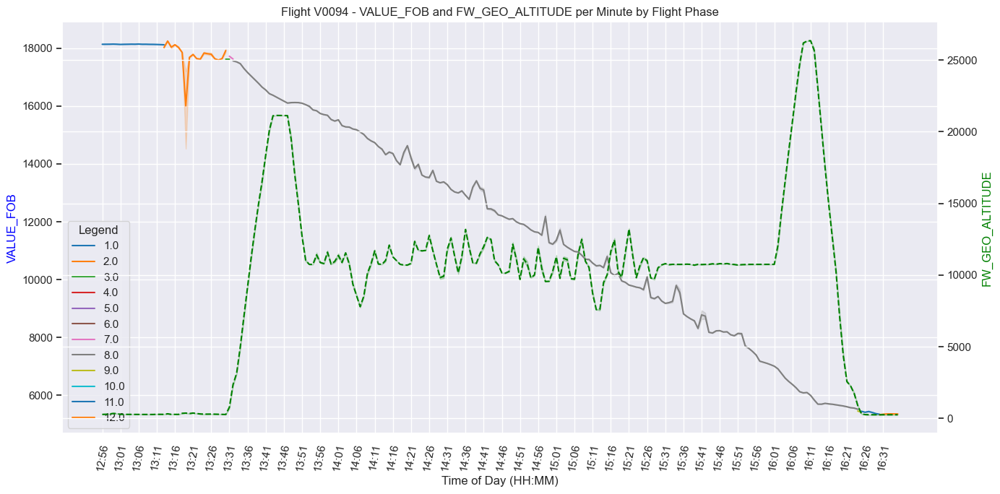

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


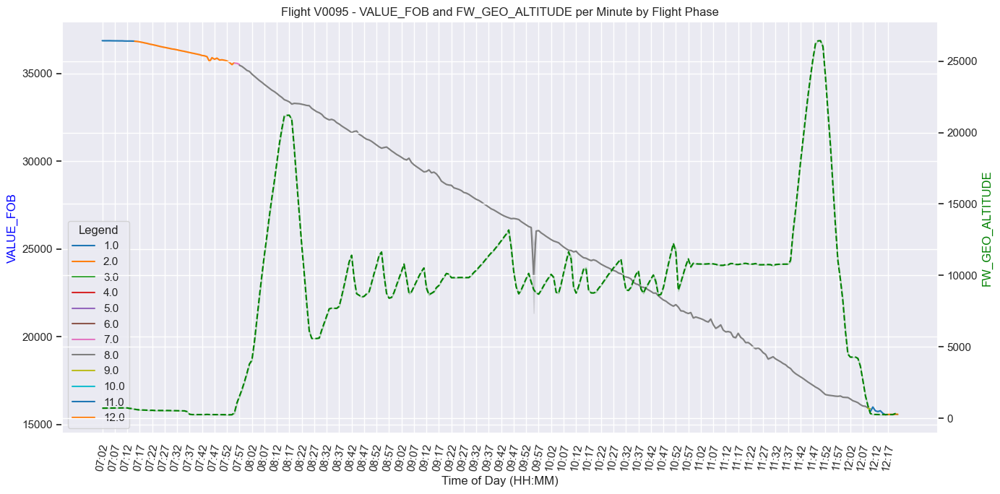

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


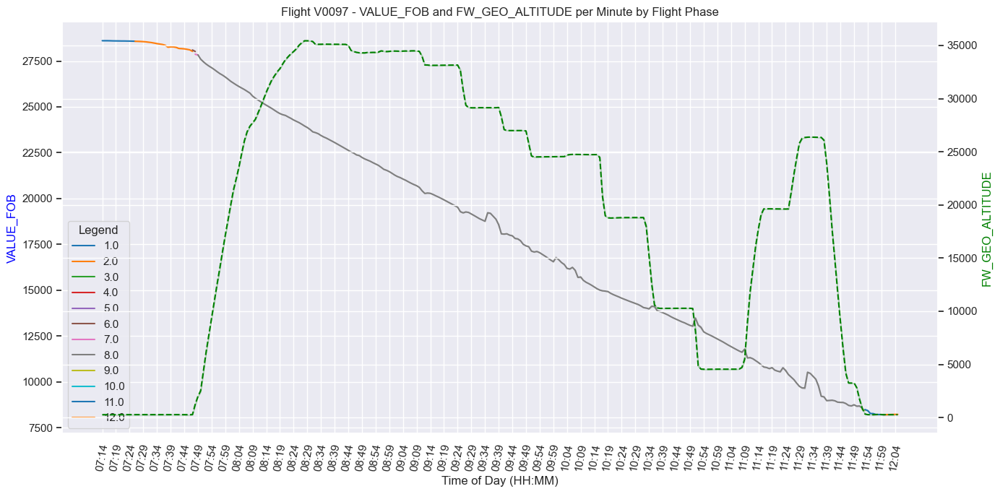

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


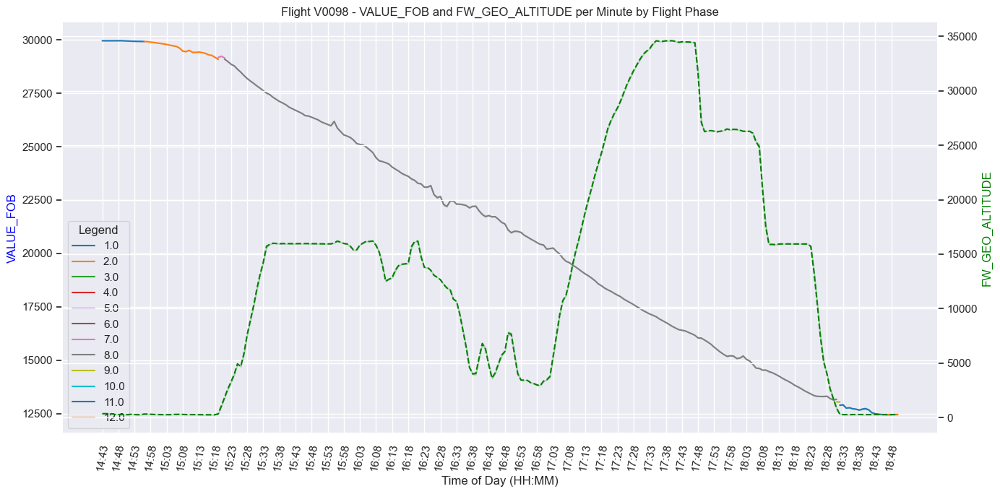

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


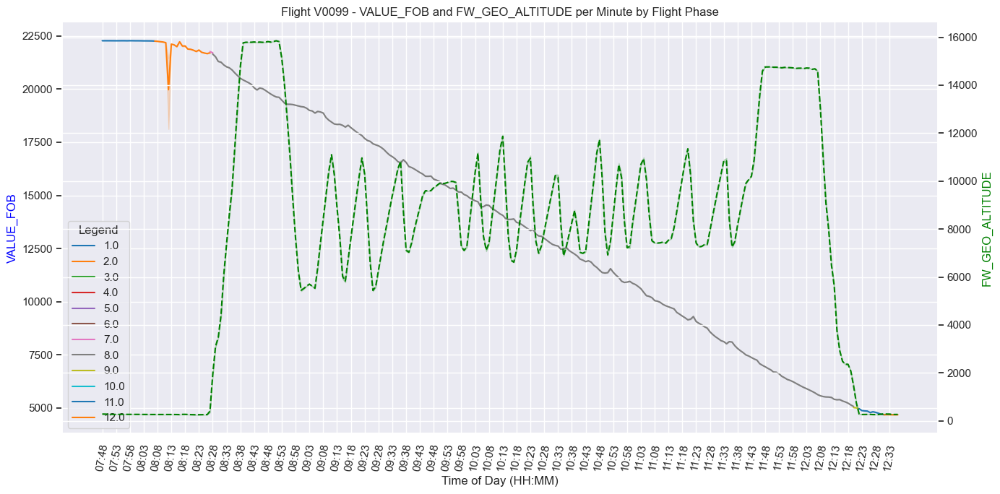

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


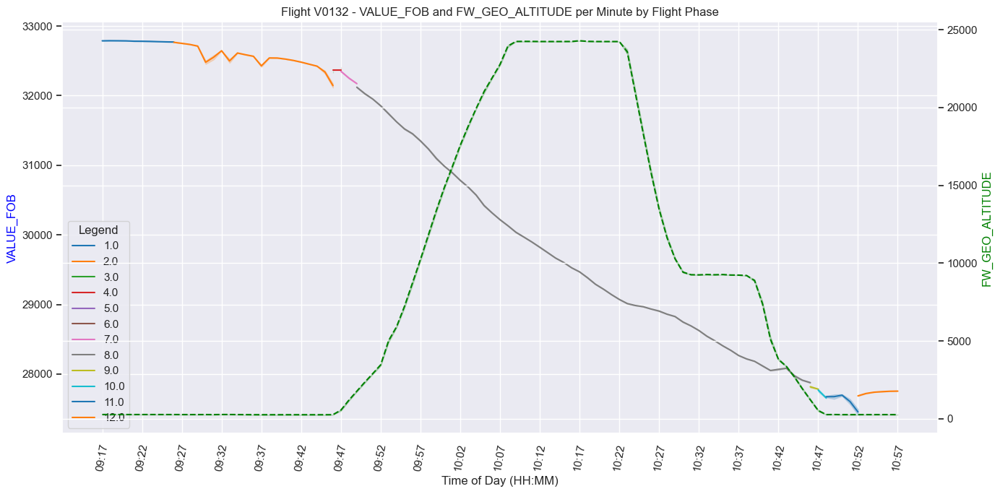

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


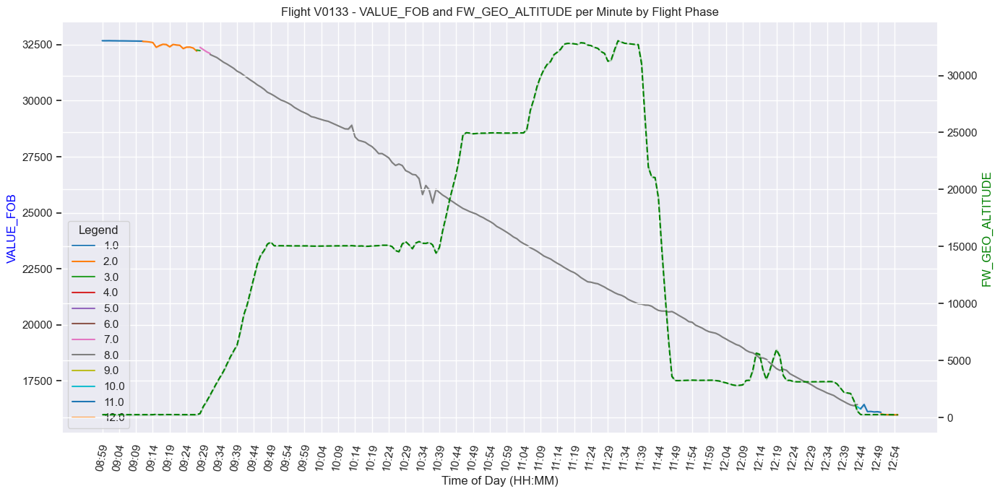

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


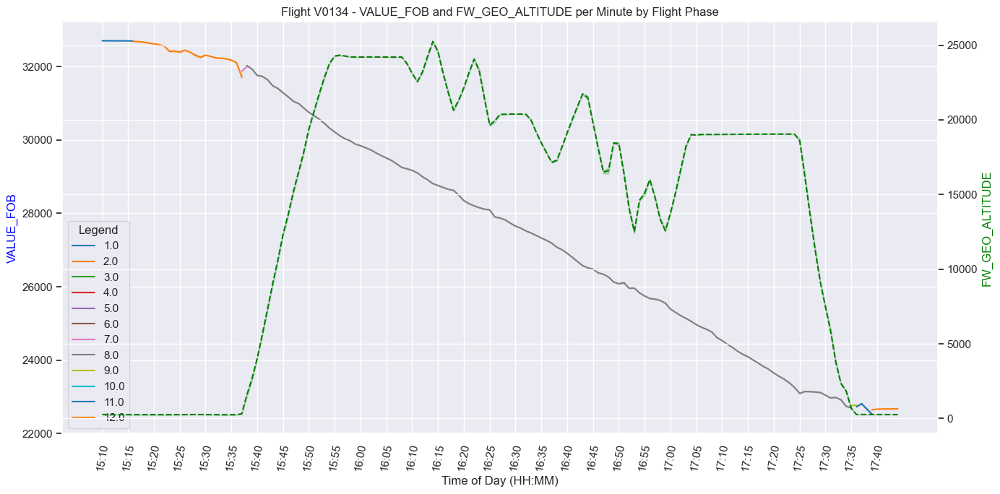

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


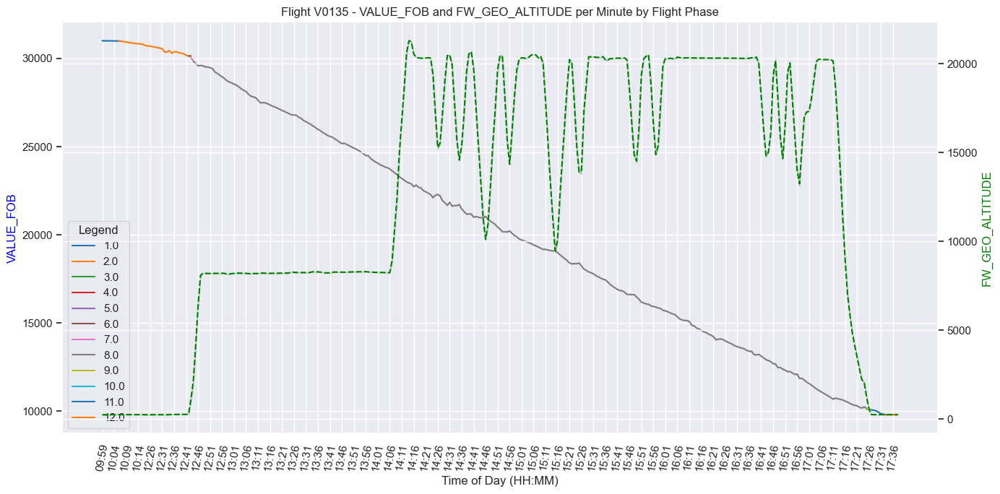

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


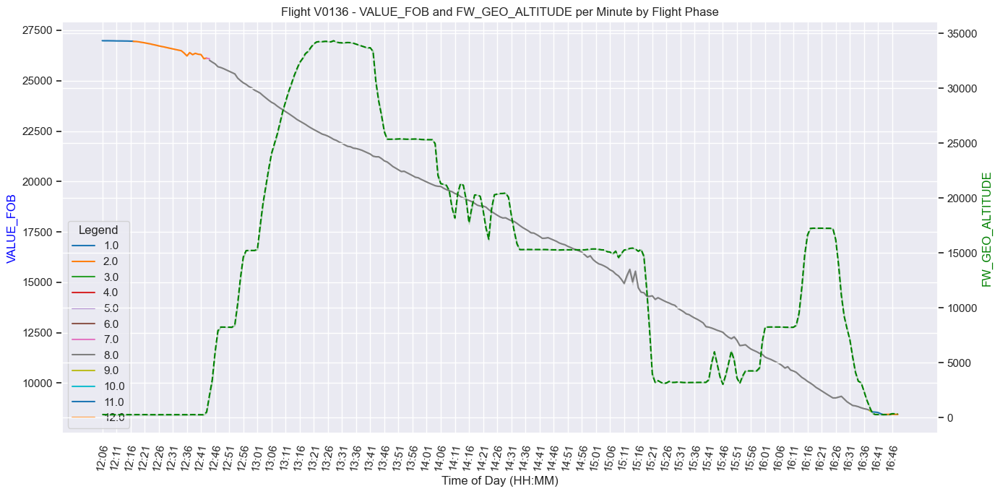

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


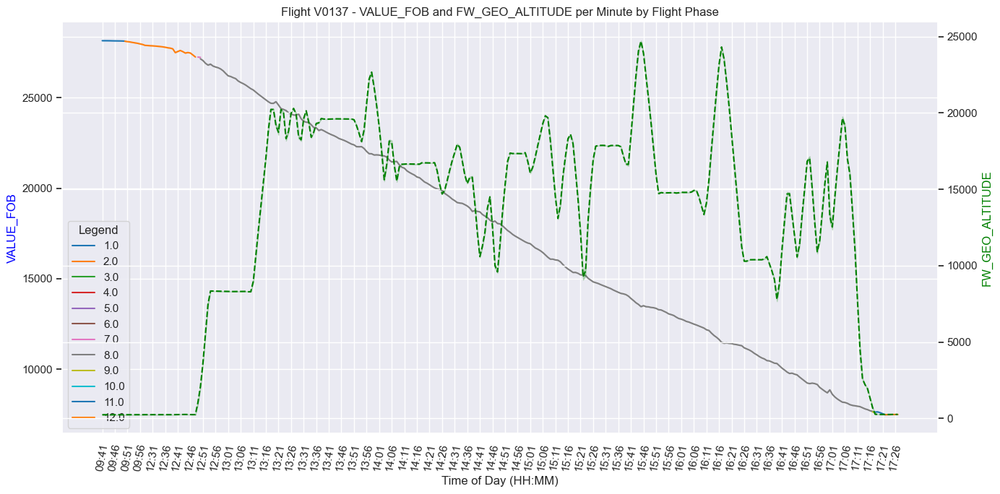

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


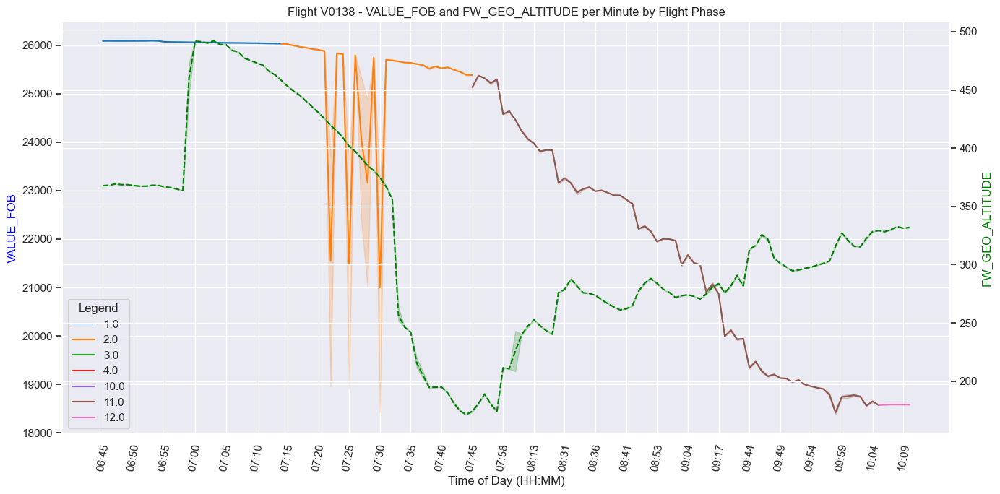

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


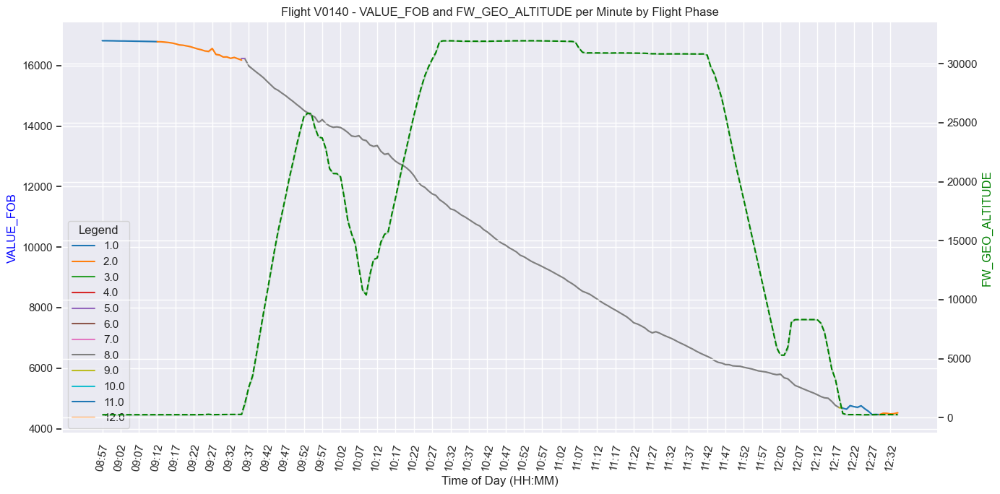

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


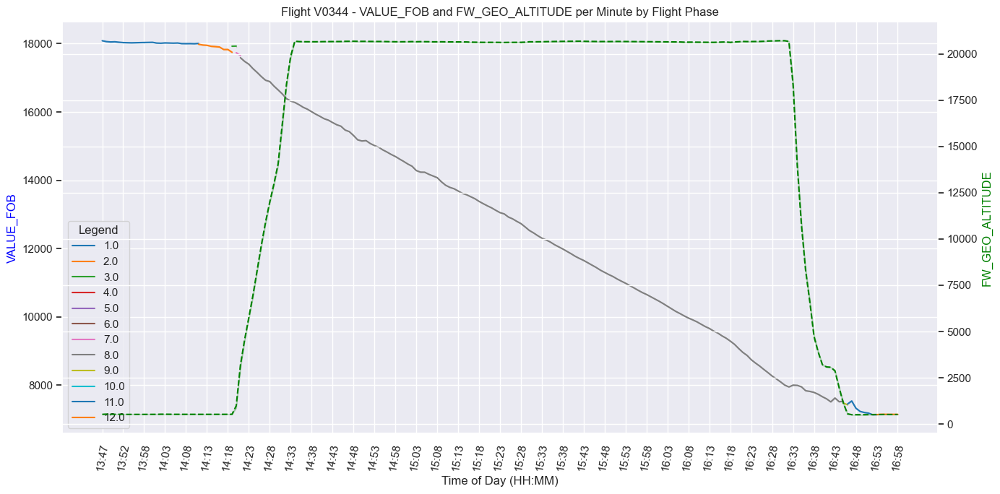

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


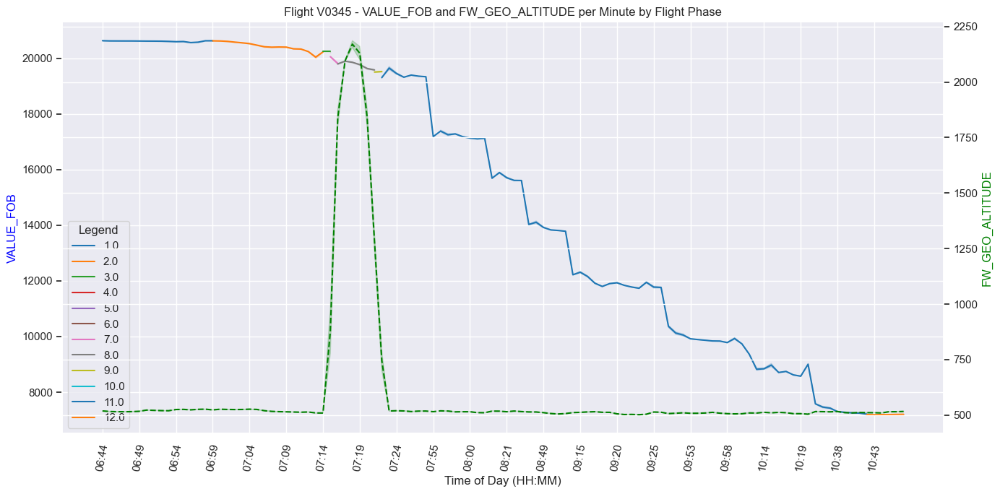

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


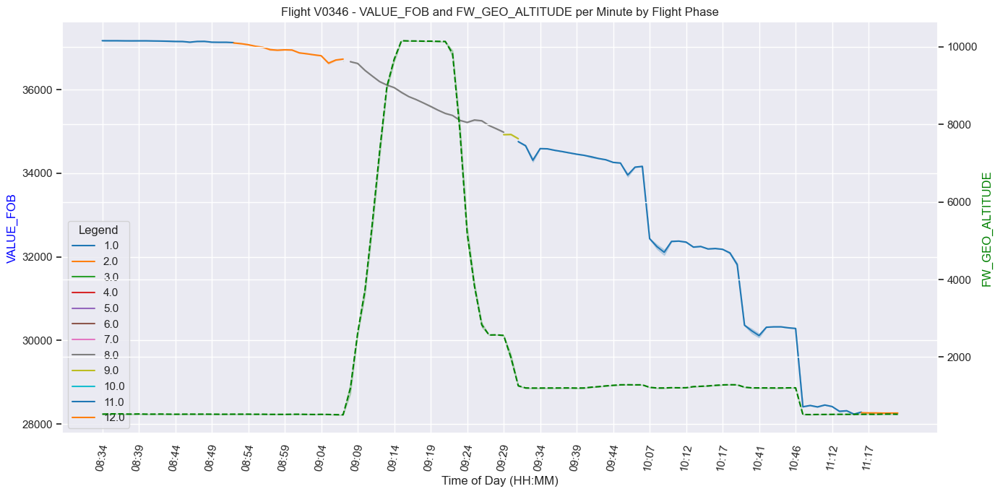

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


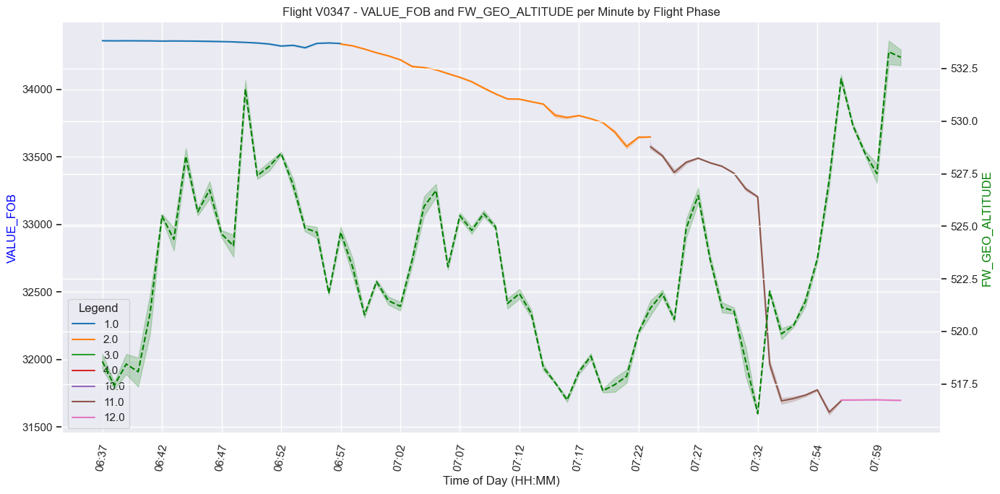

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


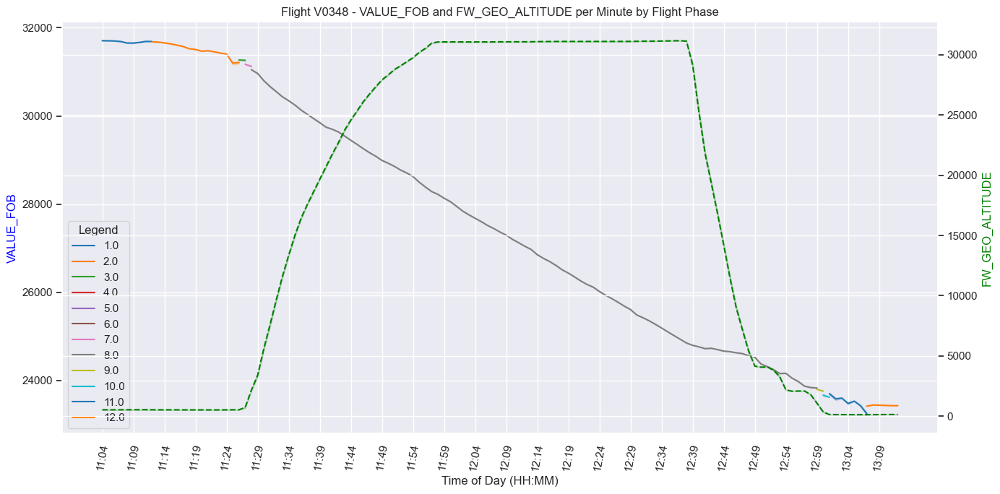

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


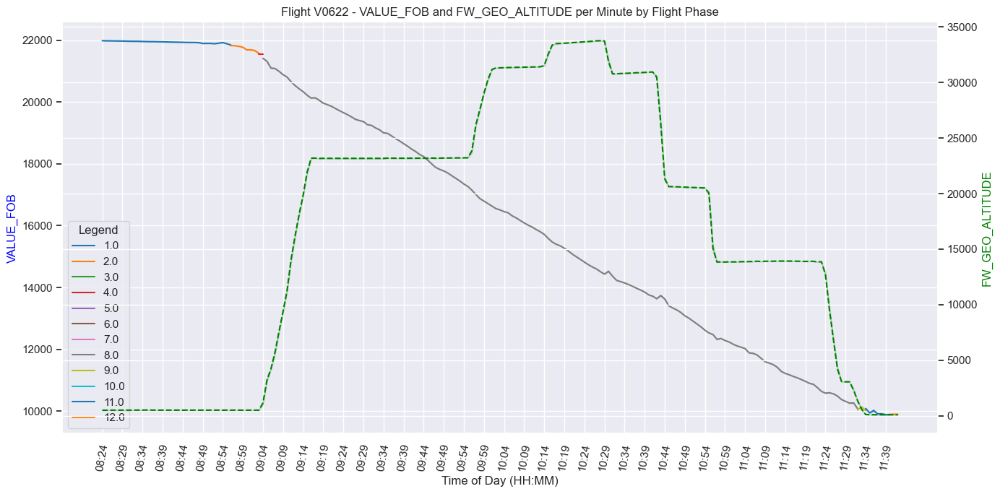

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


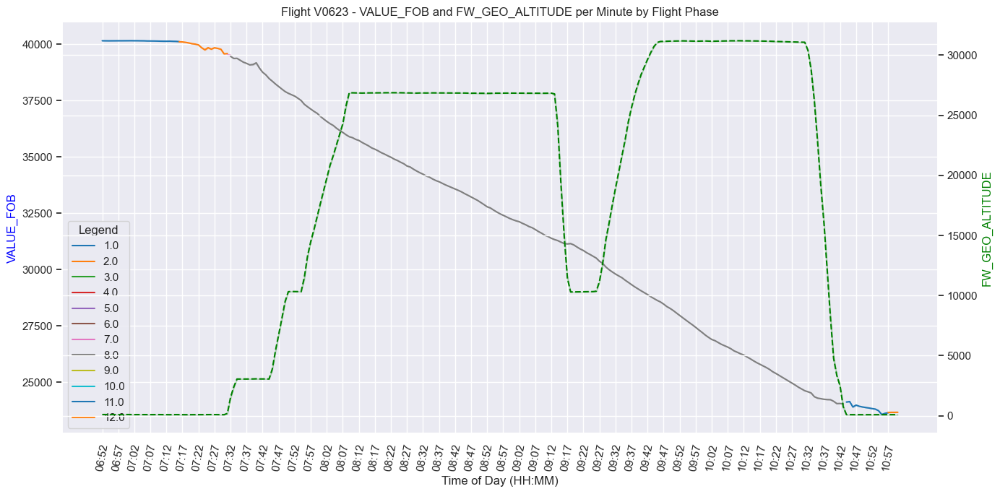

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


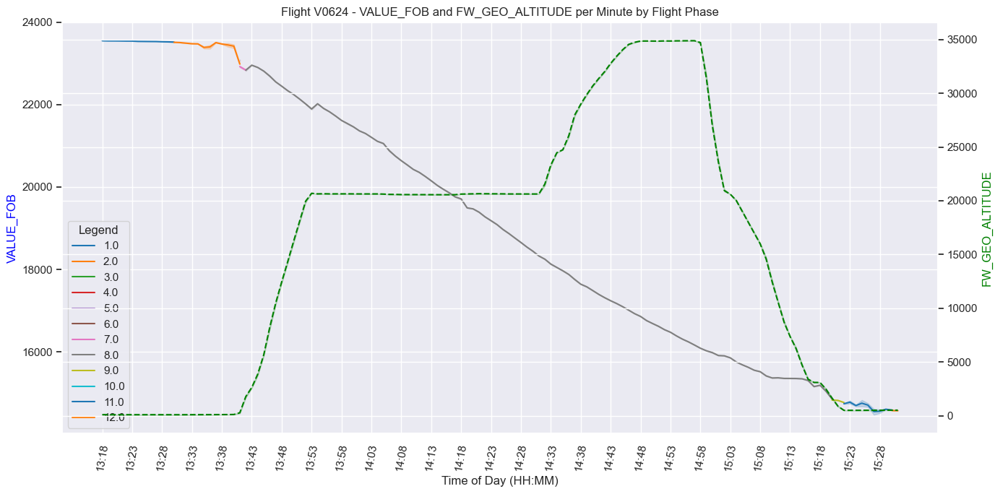

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


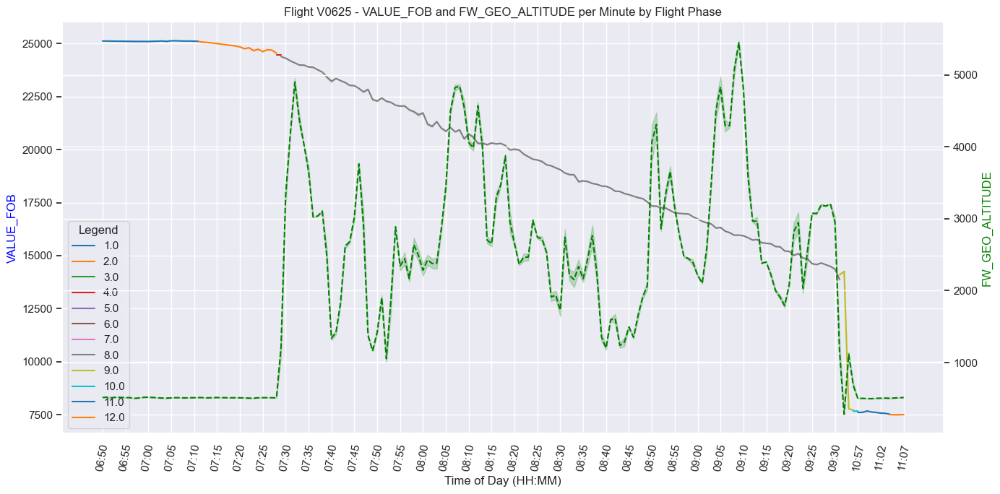

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


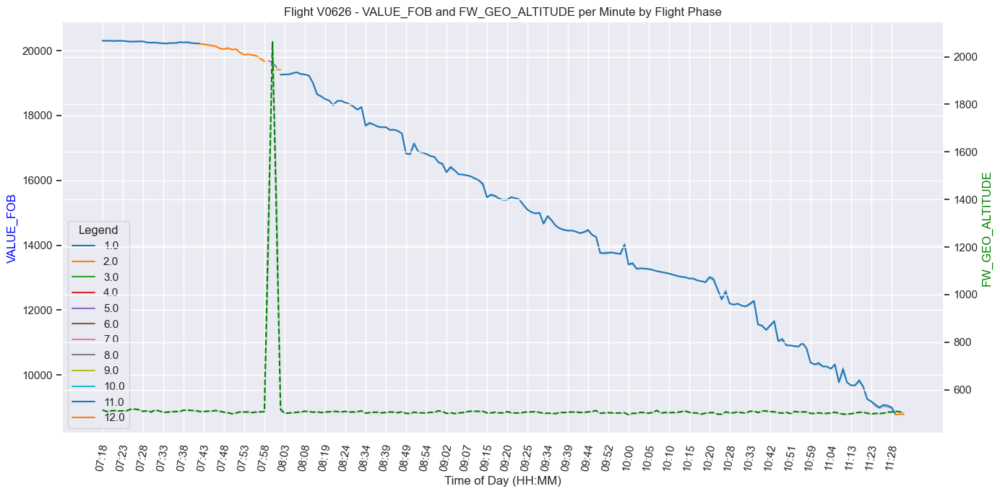

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


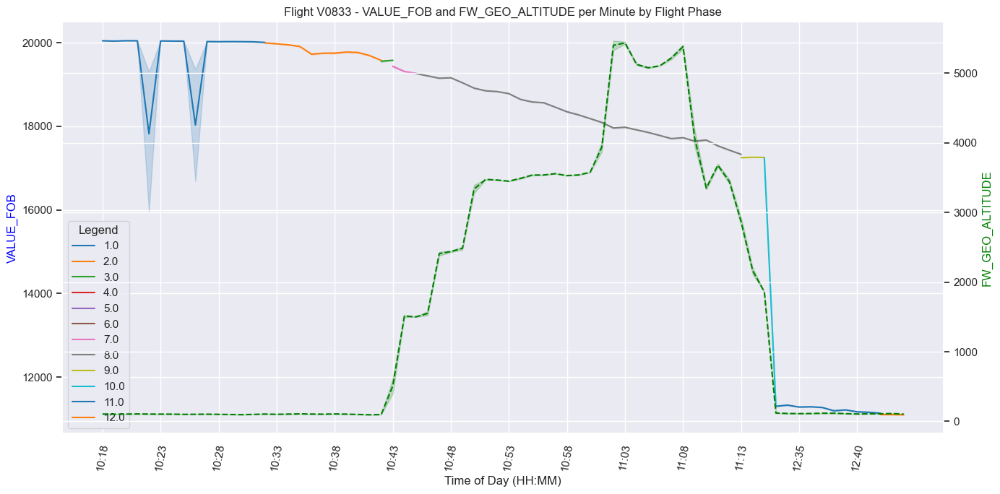

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


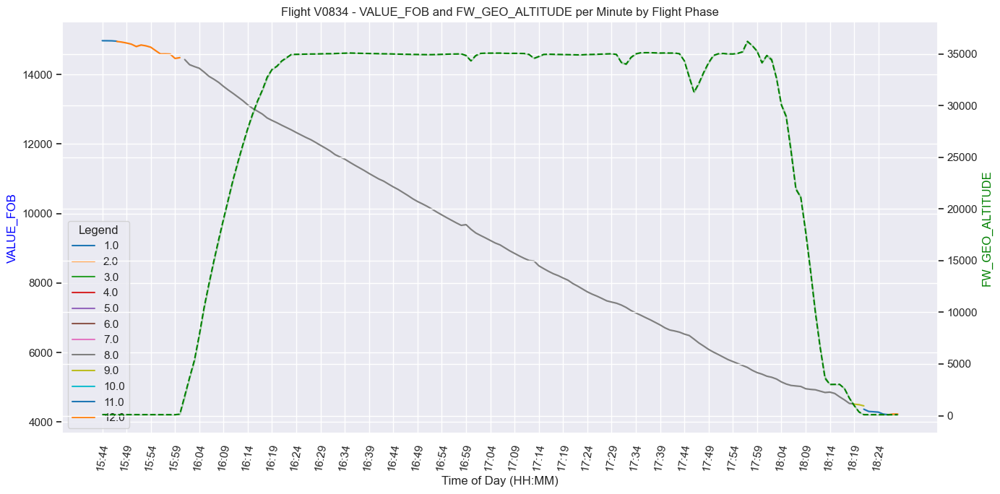

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


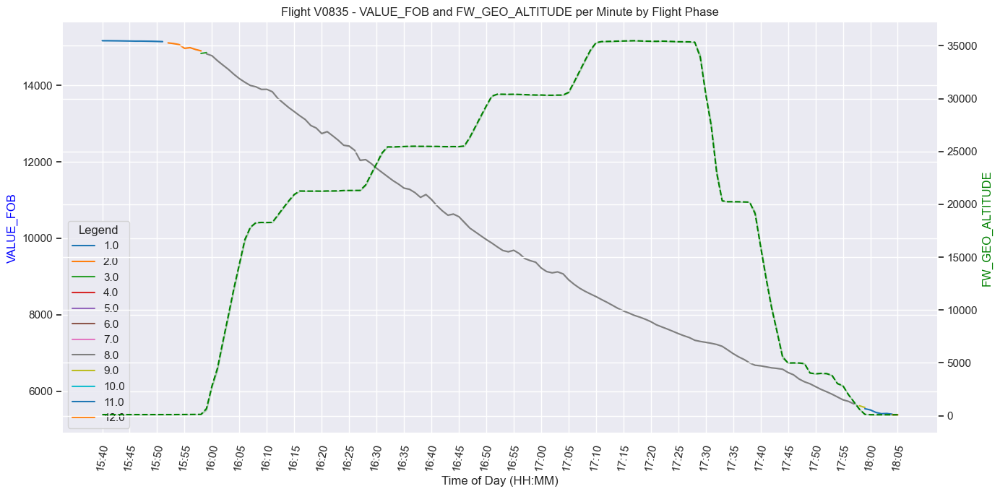

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


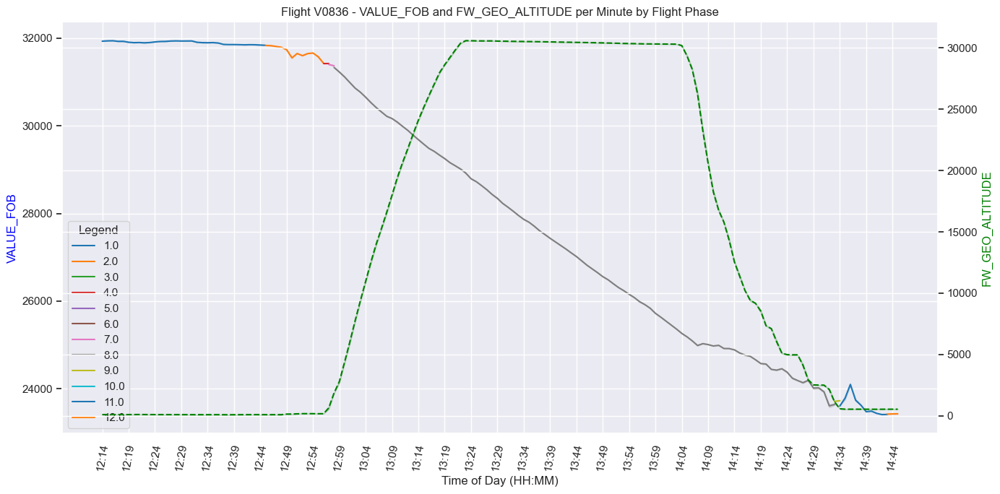

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


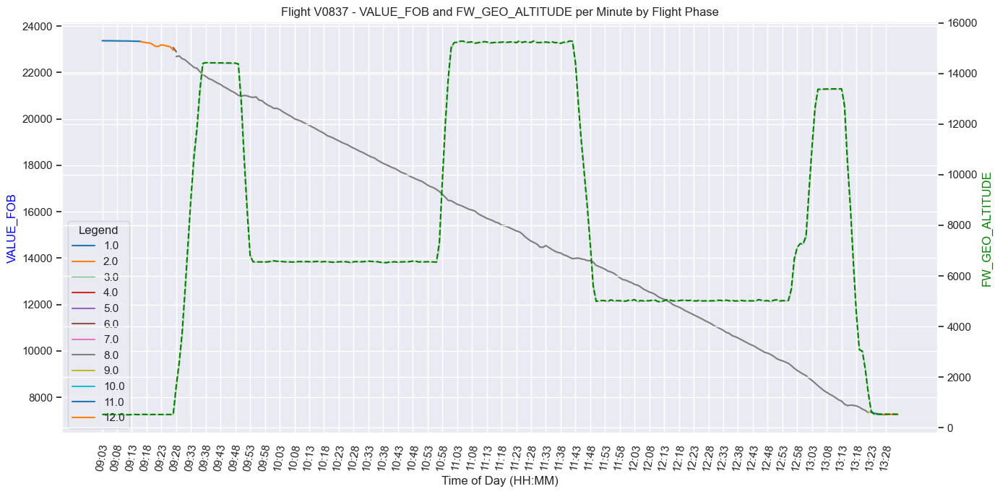

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


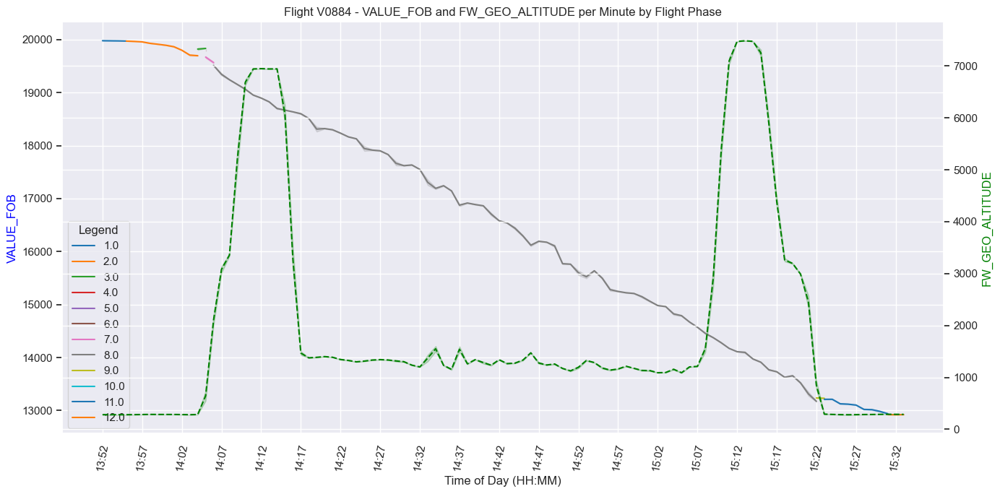

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


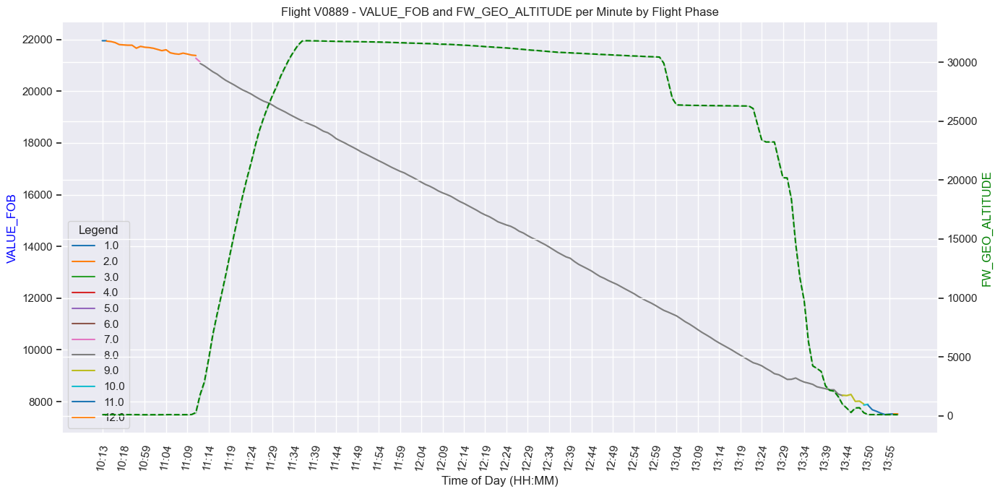

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


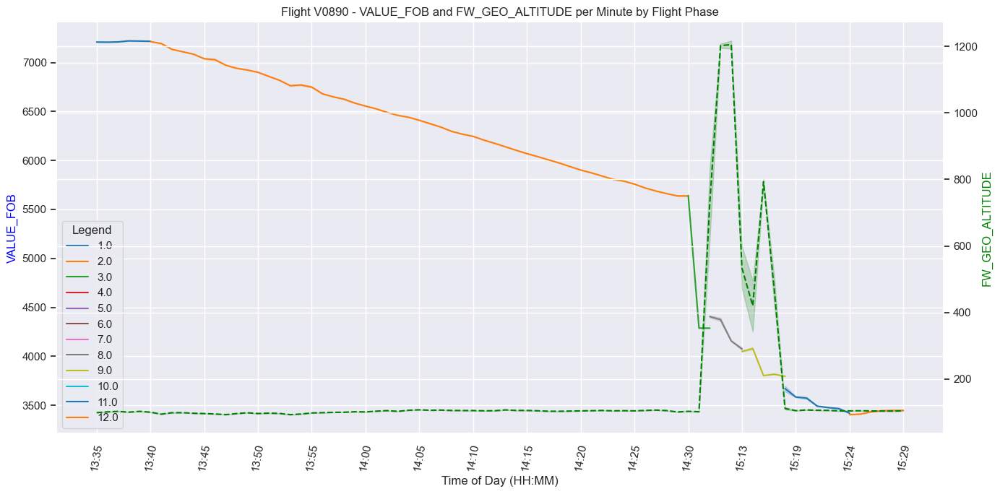

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


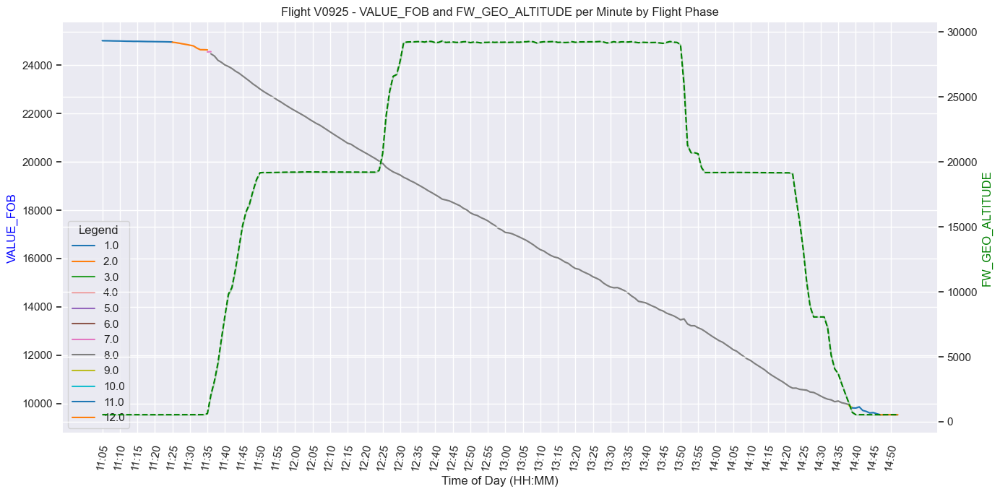

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


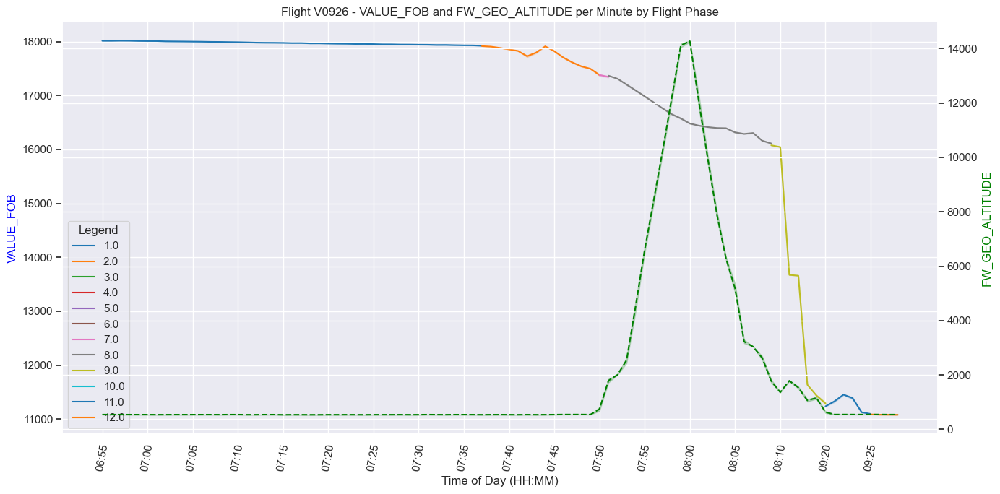

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


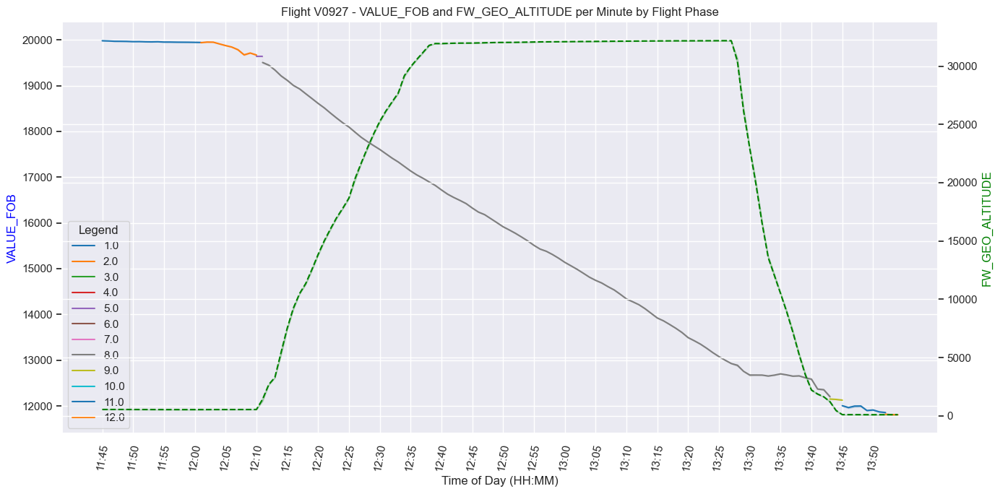

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


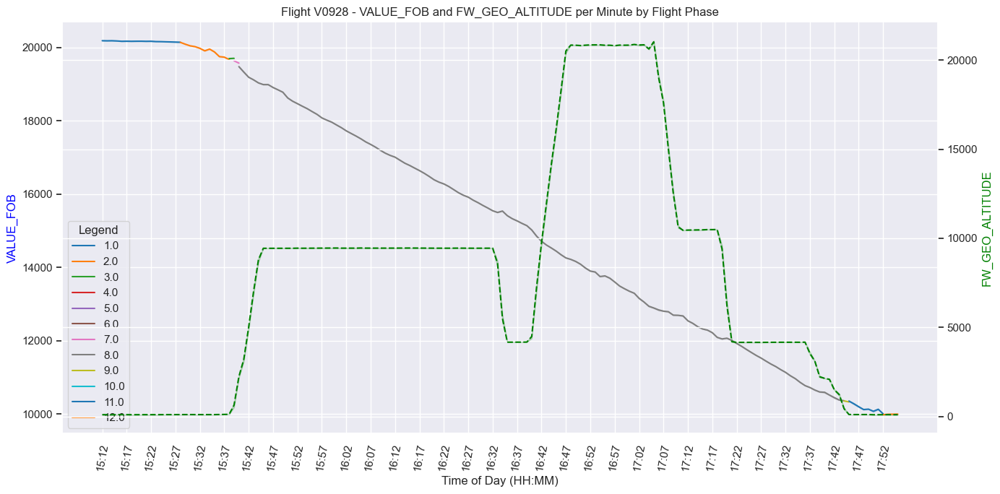

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


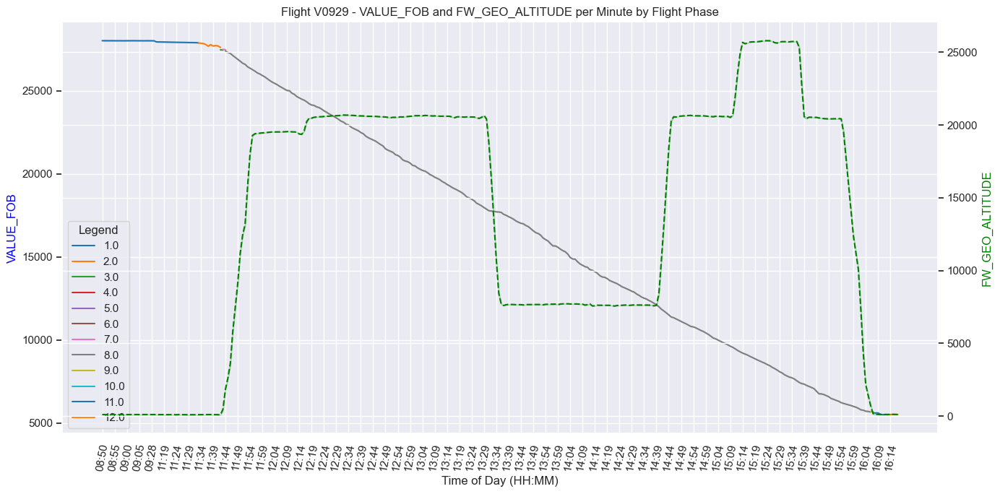

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


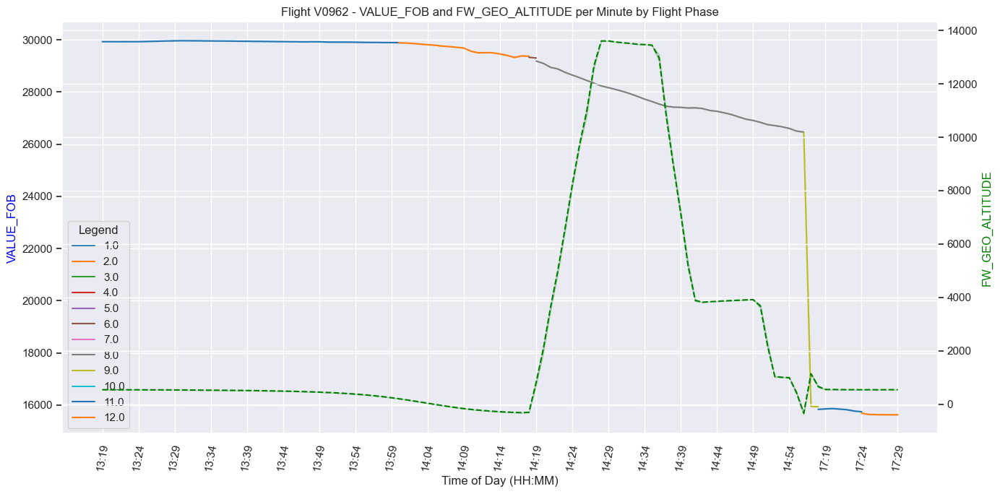

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


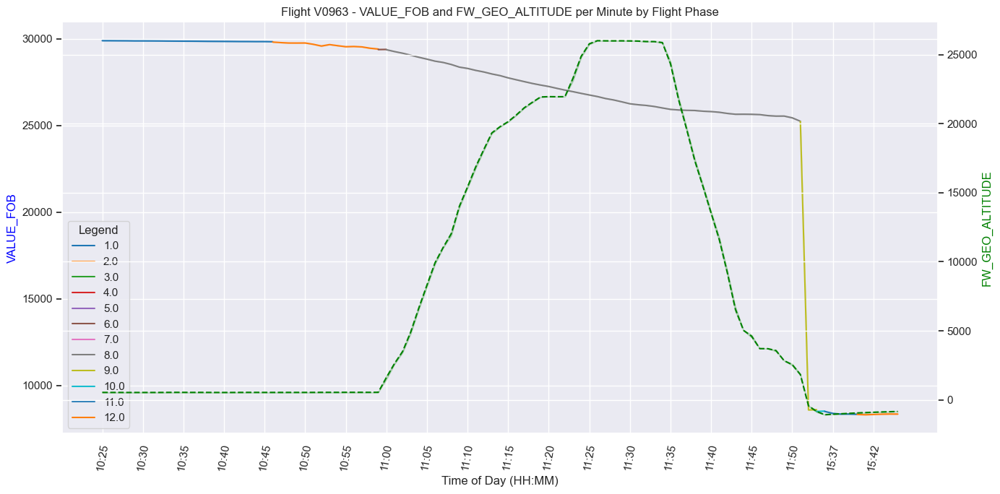

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


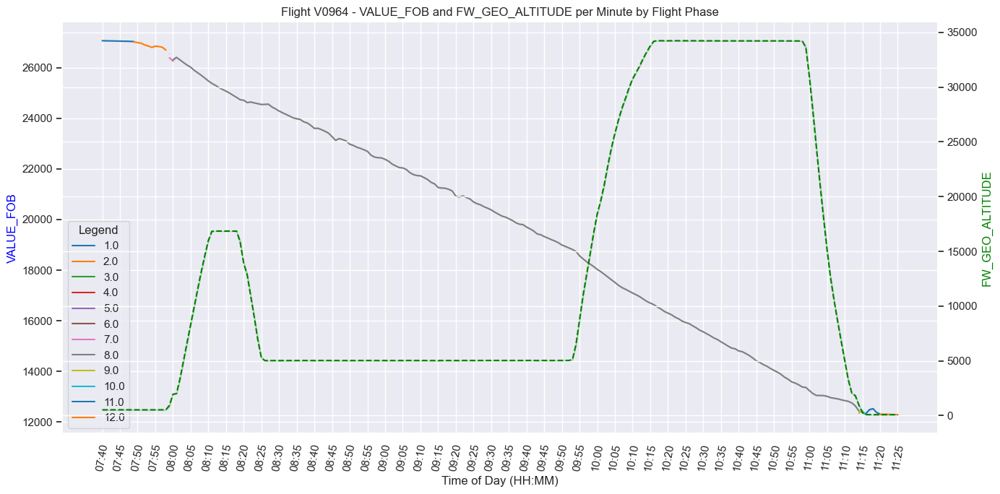

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


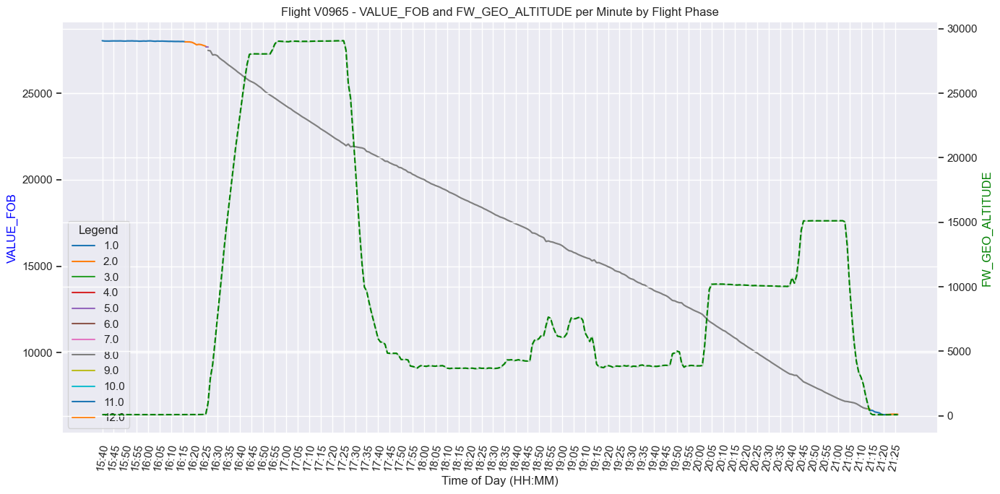

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\3011668733.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')


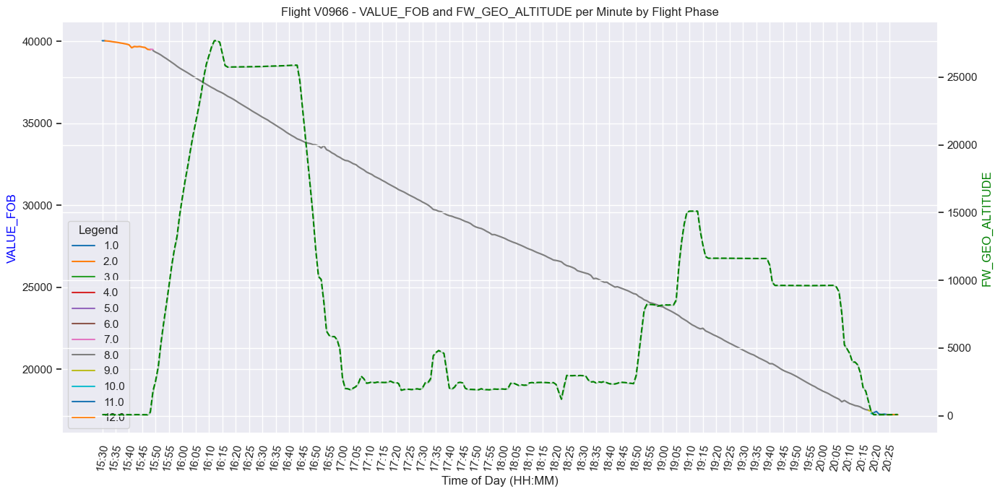

In [ ]:
for flight in flights_list:
    plot_value_fob_and_altitude_by_flight_phase_per_minute(flight, df_cleaned)

## **2.10. Correlation matrix of all variables**

In [ ]:
def order_columns(df):
    new_column_order = [
        'UTC_TIME', 'FUEL_USED_1', 'FUEL_USED_2', 'FUEL_USED_3', 'FUEL_USED_4',
        'FW_GEO_ALTITUDE', 'VALUE_FOB', 'VALUE_FUEL_QTY_CT', 'VALUE_FUEL_QTY_FT1',
        'VALUE_FUEL_QTY_FT2', 'VALUE_FUEL_QTY_FT3', 'VALUE_FUEL_QTY_FT4',
        'VALUE_FUEL_QTY_LXT', 'VALUE_FUEL_QTY_RXT', 'FLIGHT_PHASE_COUNT',
        'Flight', 'MSN'
    ]
    df = df.reindex(columns=new_column_order)
    return df

In [ ]:
df = order_columns(df)

In [ ]:
def corr_matrix(df):
    correlation_matrix = df.corr()
    plt.figure(figsize=(12, 10))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm")
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.title('Correlation Matrix')
    return plt.show()

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\876781478.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


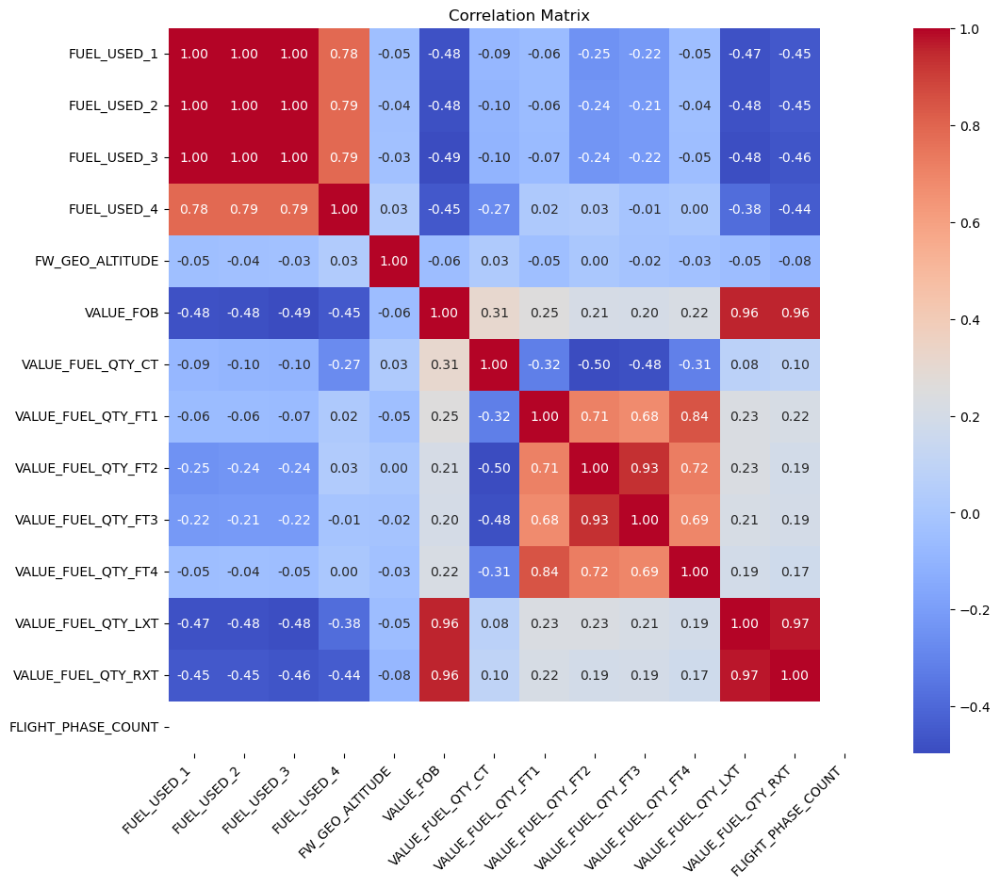

In [ ]:
corr_matrix(df)

# **3. Feature Engineering**

## **3.1. Adding new columns to perform our leak analysis**



In [ ]:
def add_new_columns(df):
    new_column_order = [
        'UTC_TIME', 'FLIGHT_PHASE_COUNT', 'Flight', 'FUEL_USED_1', 'FUEL_USED_2',
        'FUEL_USED_3', 'FUEL_USED_4','TOTAL_FUEL_USED_PERIOD', 'DELTA_TOTAL_FUEL_USED', 'CUMULATIVE_DELTA_TOTAL_FUEL_USED', 'PERCENTAGE_CHANGE_TOTAL_FUEL_USED', 'VALUE_FOB', 'DELTA_FOB',
        'CUMULATIVE_DELTA_FOB', 'PERCENTAGE_CHANGE_FOB', 'EST_FOB', 'FOB_ERROR', 'FW_GEO_ALTITUDE', 'SECONDS_OF_FLIGHT', 'FLIGHT_DURATION_SECONDS'
    ]
    df.sort_values(by=['Flight', 'UTC_TIME'], inplace=True)
    df['DELTA_FOB'] = df.groupby('Flight')['VALUE_FOB'].diff(periods=1)
    df['DELTA_FOB'] = df['DELTA_FOB'].fillna(0)
    df['DELTA_FOB'] = df['DELTA_FOB']
    df['CUMULATIVE_DELTA_FOB'] = df.groupby('Flight')['DELTA_FOB'].cumsum()
    df['CUMULATIVE_DELTA_FOB'] = df['CUMULATIVE_DELTA_FOB']
    df['TOTAL_FUEL_USED_PERIOD'] = df[['FUEL_USED_1', 'FUEL_USED_2', 'FUEL_USED_3', 'FUEL_USED_4']].sum(axis=1)
    df['DELTA_TOTAL_FUEL_USED'] = df.groupby('Flight')['TOTAL_FUEL_USED_PERIOD'].diff(periods=1).fillna(0)
    df['DELTA_TOTAL_FUEL_USED'] = df['DELTA_TOTAL_FUEL_USED']
    df['CUMULATIVE_DELTA_TOTAL_FUEL_USED'] = df.groupby('Flight')['DELTA_TOTAL_FUEL_USED'].cumsum()
    df['CUMULATIVE_DELTA_TOTAL_FUEL_USED'] = df['CUMULATIVE_DELTA_TOTAL_FUEL_USED']
    initial_fob = df.groupby('Flight')['VALUE_FOB'].transform('first')
    df['EST_FOB'] = initial_fob - df['CUMULATIVE_DELTA_TOTAL_FUEL_USED']
    df['FOB_ERROR'] = df['VALUE_FOB'] - df['EST_FOB']
    df['PERCENTAGE_CHANGE_TOTAL_FUEL_USED'] = df.groupby('Flight')['TOTAL_FUEL_USED_PERIOD'].pct_change() * 100
    df['PERCENTAGE_CHANGE_FOB'] = df.groupby('Flight')['VALUE_FOB'].pct_change() * 100
    df['PERCENTAGE_CHANGE_TOTAL_FUEL_USED'].fillna(0, inplace=True)
    df['PERCENTAGE_CHANGE_TOTAL_FUEL_USED'].replace(to_replace=[np.inf, -np.inf], value=0, inplace=True)
    df['PERCENTAGE_CHANGE_FOB'].fillna(0, inplace=True)
    df['PERCENTAGE_CHANGE_FOB'].replace(to_replace=[np.inf, -np.inf], value=100, inplace=True)
    df['SECONDS_OF_FLIGHT'] = df.groupby('Flight')['UTC_TIME'].transform(lambda x: (x - x.iloc[0]).dt.total_seconds())
    flight_duration = df.groupby('Flight')['UTC_TIME'].apply(lambda x: (x.iloc[-1] - x.iloc[0]).total_seconds())
    df['FLIGHT_DURATION_SECONDS'] = df['Flight'].map(flight_duration)
    df = df.loc[
        df[['VALUE_FOB']].notnull().all(axis=1) &
        (df['FLIGHT_PHASE_COUNT'] > 0)
    ]
    df = df.reindex(columns=new_column_order)
    return df

## **3.2. Adjusting all the datasets to have the same structure**

In [ ]:
adjusted_datasets = {}
for label, df in datasets_dict.items():
    df_filtered, f_list = filter_flights_with_most_phase_8 (df)
    adjusted_df = add_new_columns(df_filtered)
    adjusted_df = adjusted_df.reindex(columns=new_column_order)
    adjusted_datasets[label] = adjusted_df

,UTC_TIME,FLIGHT_PHASE_COUNT,Flight,FUEL_USED_1,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,TOTAL_FUEL_USED_PERIOD,DELTA_TOTAL_FUEL_USED,VALUE_FOB,DELTA_FOB,CUMULATIVE_DELTA_FOB,EST_FUEL_USED_FROM_FOB,FW_GEO_ALTITUDE
0,2016-07-27 13:31:37,2.0,0.0,NaN,NaN,NaN,NaN,0.000000,0.000000,19862.0,0.0,0.0,0.0,36.0
1,2016-07-27 13:31:38,2.0,0.0,NaN,NaN,NaN,NaN,0.000000,0.000000,19862.0,0.0,0.0,0.0,38.0
2,2016-07-27 13:31:39,2.0,0.0,NaN,NaN,NaN,NaN,0.000000,0.000000,19862.0,0.0,0.0,0.0,38.0
3,2016-07-27 13:31:40,2.0,0.0,NaN,NaN,NaN,NaN,0.000000,0.000000,19862.0,0.0,0.0,0.0,35.0
4,2016-07-27 13:31:41,2.0,0.0,NaN,NaN,NaN,NaN,0.000000,0.000000,19862.0,0.0,0.0,0.0,36.0
5,2016-07-27 13:31:42,2.0,0.0,NaN,NaN,NaN,NaN,0.000000,0.000000,19862.0,0.0,0.0,0.0,35.0
6,2016-07-27 13:31:43,2.0,0.0,NaN,NaN,NaN,NaN,0.000000,0.000000,19862.0,0.0,0.0,0.0,35.0
7,2016-07-27 13:31:44,2.0,0.0,NaN,NaN,NaN,NaN,0.000000,0.000000,19863.0,1.0,1.0,-1.0,36.0
8,2016-07-27 13:31:45,2.0,0.0,NaN,NaN,NaN,NaN,0.000000,0.000000,19861.0,-2.0,-1.0,1.0,35.0
9,2016-07-27 13:31:46,2.0,0.0,NaN,NaN,NaN,NaN,0.000000,0.000000,19861.0,0.0,-1.0,1.0,35.0


## **3.3. Addressing sensor errors (zero values)**

In [ ]:
def interpolate_fob(df, flight_column='Flight', fob_column='VALUE_FOB', time_column='UTC_TIME'):
    for flight in df[flight_column].unique():
        flight_df = df[df[flight_column] == flight]
        unreasonable_fob = (flight_df[fob_column] == 0)
        if unreasonable_fob.any():
            df.loc[flight_df.index, fob_column] = flight_df[fob_column].replace(0, np.nan).interpolate(method='linear', limit_direction='both')
    return df

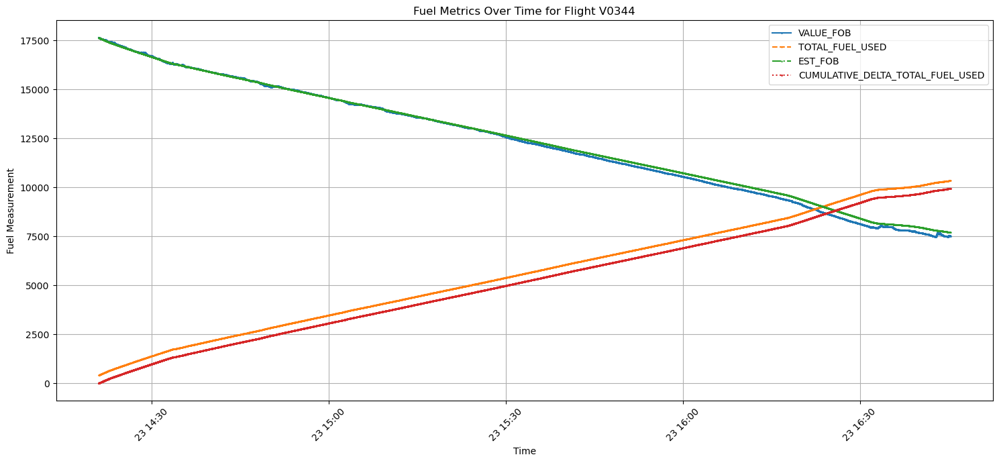

In [ ]:
import matplotlib.pyplot as plt
specific_flight = 'V0344'
flight_df = adjusted_msn02[adjusted_msn02['Flight'] == specific_flight]
plt.figure(figsize=(15, 7))
plt.plot(flight_df['UTC_TIME'], flight_df['VALUE_FOB'], label='VALUE_FOB', marker='o', markersize=1, linestyle='-')
plt.plot(flight_df['UTC_TIME'], flight_df['TOTAL_FUEL_USED_PERIOD'], label='TOTAL_FUEL_USED', marker='x', markersize=1, linestyle='--')
plt.plot(flight_df['UTC_TIME'], flight_df['EST_FOB'], label='EST_FOB', marker='^', markersize=1, linestyle='-.')
plt.plot(flight_df['UTC_TIME'], flight_df['CUMULATIVE_DELTA_TOTAL_FUEL_USED'], label='CUMULATIVE_DELTA_TOTAL_FUEL_USED', marker='s', markersize=1, linestyle=':')
plt.title(f'Fuel Metrics Over Time for Flight {specific_flight}')
plt.xlabel('Time')
plt.ylabel('Fuel Measurement')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## **3.4. Handling Outliers in our modified dataset**

### **3.4.1. Checking for outliers on each column**

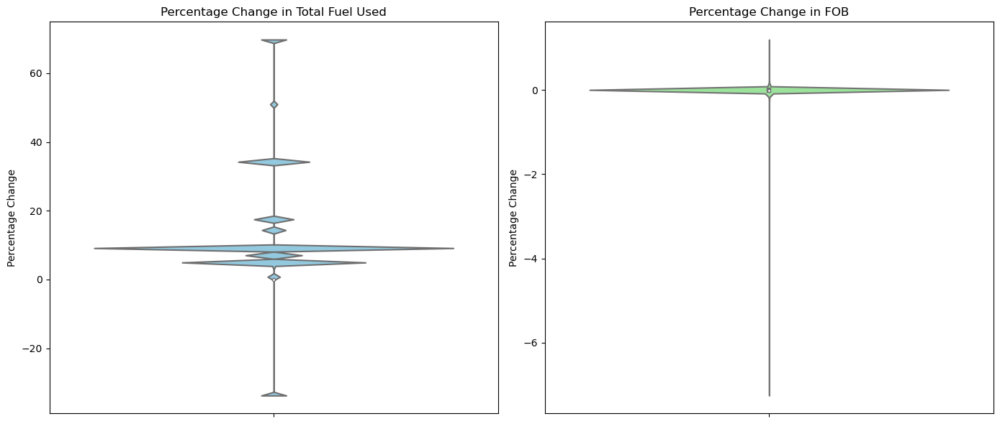

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))
sns.violinplot(y=adjusted_msn02['PERCENTAGE_CHANGE_TOTAL_FUEL_USED'], ax=axs[0], color='skyblue')
axs[0].set_title('Percentage Change in Total Fuel Used')
axs[0].set_ylabel('Percentage Change')
sns.violinplot(y=adjusted_msn02['PERCENTAGE_CHANGE_FOB'], ax=axs[1], color='lightgreen')
axs[1].set_title('Percentage Change in FOB')
axs[1].set_ylabel('Percentage Change')
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
from pandas.api.types import is_numeric_dtype
def number_outliers_per_flight_and_feature(dataset, IQR_num):
    """
    Counts the number of outliers present in the data per feature and per flight.
    :param dataset: DataFrame containing flight data.
    :param IQR_num: Multiplier for the IQR to define the outlier threshold.
    :return: DataFrame with the count of outliers per feature per flight.
    """
    numeric_columns = [col for col in dataset.columns if is_numeric_dtype(dataset[col]) and dataset[col].dtypes.name != 'bool']
    outlier_counts = pd.DataFrame()
    for flight in dataset['Flight'].unique():
        flight_data = dataset[dataset['Flight'] == flight]
        flight_outliers = {}
        for column in numeric_columns:
            Q1 = flight_data[column].quantile(0.25)
            Q3 = flight_data[column].quantile(0.75)
            IQR = Q3 - Q1
            threshold_upper = Q3 + (IQR_num * IQR)
            threshold_lower = Q1 - (IQR_num * IQR)
            flight_outliers[column] = flight_data[(flight_data[column] > threshold_upper) |
                                                   (flight_data[column] < threshold_lower)][column].count()
        flight_outliers_df = pd.DataFrame(flight_outliers, index=[flight])
        flight_outliers_df['Flight'] = flight
        outlier_counts = pd.concat([outlier_counts, flight_outliers_df], axis=0)
    outlier_counts.reset_index(drop=True, inplace=True)
    return outlier_counts

In [ ]:
IQR_multiplier = 3
outliers_count_df = number_outliers_per_flight_and_feature(adjusted_msn02, IQR_multiplier)
outliers_count_df.head(50)

,FLIGHT_PHASE_COUNT,TOTAL_FUEL_USED_PERIOD,DELTA_TOTAL_FUEL_USED,CUMULATIVE_DELTA_TOTAL_FUEL_USED,PERCENTAGE_CHANGE_TOTAL_FUEL_USED,VALUE_FOB,DELTA_FOB,CUMULATIVE_DELTA_FOB,PERCENTAGE_CHANGE_FOB,EST_FOB,FOB_ERROR,FW_GEO_ALTITUDE,SECONDS_OF_FLIGHT,FLIGHT_DURATION_SECONDS,Flight
0,0,0,0,0,657,0,766,0,718,0,494,1649,0,0,V0094
1,0,0,5,0,732,0,361,0,572,0,2150,1667,0,0,V0095
2,0,0,1,0,1220,0,576,0,865,0,282,0,0,0,V0097
3,0,0,0,0,619,0,349,0,416,0,134,0,0,0,V0098
4,0,0,17,0,700,0,415,0,543,0,0,0,0,0,V0099
5,0,0,0,0,7,0,44,0,62,0,44,0,0,0,V0132
6,0,0,0,0,733,0,307,0,483,0,0,0,0,0,V0133
7,0,0,0,0,524,0,92,0,160,0,0,0,0,0,V0134
8,0,0,0,0,970,0,361,0,680,0,0,0,0,0,V0135
9,0,0,0,0,1349,0,421,0,649,0,77,0,0,0,V0136


### **3.4.2. Flagging outliers in new columns for FOB and TOTAL_FUEL_USED**

In [ ]:
def flag_outliers(dataset, IQR_num=3):
    def calculate_bounds(column):
        Q1 = dataset[column].quantile(0.25)
        Q3 = dataset[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - (IQR_num * IQR)
        upper_bound = Q3 + (IQR_num * IQR)
        return lower_bound, upper_bound
    lower_bound_pct_change_fob, upper_bound_pct_change_fob = calculate_bounds('PERCENTAGE_CHANGE_FOB')
    lower_bound_delta_fob, upper_bound_delta_fob = calculate_bounds('DELTA_FOB')
    lower_bound_pct_change_total_fuel, upper_bound_pct_change_total_fuel = calculate_bounds('PERCENTAGE_CHANGE_TOTAL_FUEL_USED')
    lower_bound_delta_total_fuel, upper_bound_delta_total_fuel = calculate_bounds('DELTA_TOTAL_FUEL_USED')
    dataset['IS_OUTLIER_FOB'] = ((dataset['PERCENTAGE_CHANGE_FOB'] > upper_bound_pct_change_fob) | \
                                 (dataset['PERCENTAGE_CHANGE_FOB'] < lower_bound_pct_change_fob) | \
                                 (dataset['DELTA_FOB'] > upper_bound_delta_fob) | \
                                 (dataset['DELTA_FOB'] < lower_bound_delta_fob)).astype(int)
    dataset['IS_OUTLIER_TOTAL_FUEL_USED'] = ((dataset['PERCENTAGE_CHANGE_TOTAL_FUEL_USED'] > upper_bound_pct_change_total_fuel) | \
                                             (dataset['PERCENTAGE_CHANGE_TOTAL_FUEL_USED'] < lower_bound_pct_change_total_fuel) | \
                                             (dataset['DELTA_TOTAL_FUEL_USED'] > upper_bound_delta_total_fuel) | \
                                             (dataset['DELTA_TOTAL_FUEL_USED'] < lower_bound_delta_total_fuel)).astype(int)
    return dataset
adjusted_msn02 = flag_outliers(adjusted_msn02)
adjusted_msn02[['UTC_TIME', 'Flight', 'VALUE_FOB', 'TOTAL_FUEL_USED_PERIOD', 'IS_OUTLIER_FOB', 'IS_OUTLIER_TOTAL_FUEL_USED']].head()

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\2342746356.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['IS_OUTLIER_FOB'] = ((dataset['PERCENTAGE_CHANGE_FOB'] > upper_bound_pct_change_fob) | \
C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\2342746356.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['IS_OUTLIER_TOTAL_FUEL_USED'] = ((dataset['PERCENTAGE_CHANGE_TOTAL_FUEL_USED'] > upper_bound_pct_change_total_fuel) | \


,UTC_TIME,Flight,VALUE_FOB,TOTAL_FUEL_USED_PERIOD,IS_OUTLIER_FOB,IS_OUTLIER_TOTAL_FUEL_USED
570762,2010-10-26 13:32:07,V0094,17603.0,687.4791,0,0
570763,2010-10-26 13:32:08,V0094,17604.0,689.5716,0,1
570764,2010-10-26 13:32:09,V0094,17595.0,691.6615,0,1
570765,2010-10-26 13:32:10,V0094,17594.0,693.6898,0,1
570766,2010-10-26 13:32:11,V0094,17599.0,695.6543,0,1


## **3.5. Implementing Smoothing to variables with high number of outliers**

### **3.5.1. Moving Avergae approach**

In [ ]:
import pandas as pd
def MA_implementation(adjusted_msn02, window_size = 600):
    window_size = 600
    adjusted_msn02['VALUE_FOB_MOVING_AVG'] = adjusted_msn02.groupby('Flight')['VALUE_FOB'].transform(lambda x: x.rolling(window=window_size, min_periods=1).mean())
    adjusted_msn02['TOTAL_FUEL_USED_PERIOD_MOVING_AVG'] = adjusted_msn02.groupby('Flight')['TOTAL_FUEL_USED_PERIOD'].transform(lambda x: x.rolling(window=window_size, min_periods=1).mean())
    return adjusted_msn02

In [ ]:
adjusted_msn02 = MA_implementation(adjusted_msn02)

### **3.5.2. Robust Regression**

In [ ]:
import pandas as pd
from sklearn.linear_model import RANSACRegressor
def apply_robust_regression(df, target_column = 'VALUE_FOB', group_column = 'Flight'):
    adjusted_column_name = f'ADJUSTED_{target_column}'
    df[adjusted_column_name] = df[target_column]
    for group in df[group_column].unique():
        group_data = df[df[group_column] == group]
        X = group_data.index.to_numpy().reshape(-1, 1)
        y = group_data[target_column]
        ransac = RANSACRegressor()
        ransac.fit(X, y)
        df.loc[df[group_column] == group, adjusted_column_name] = ransac.predict(X)
    return df
adjusted_msn02 = apply_robust_regression(adjusted_msn02, 'VALUE_FOB', 'Flight')

### **3.5.3. Polynomial Regression per flight**

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
def poly_regression_per_flight(adjusted_msn02):
    degree = 5
    for flight in adjusted_msn02['Flight'].unique():
        flight_data = adjusted_msn02[adjusted_msn02['Flight'] == flight]
        X_flight = flight_data[['SECONDS_OF_FLIGHT']].values.reshape(-1, 1)
        y_flight = flight_data['VALUE_FOB'].values
        model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
        model.fit(X_flight, y_flight)
        y_pred_flight = model.predict(X_flight)
        adjusted_msn02.loc[adjusted_msn02['Flight'] == flight, 'FOB_POLY'] = y_pred_flight
    return adjusted_msn02
adjusted_msn02 = poly_regression_per_flight(adjusted_msn02)

### **3.5.4. Ploting FOB and all the smoothing methods**

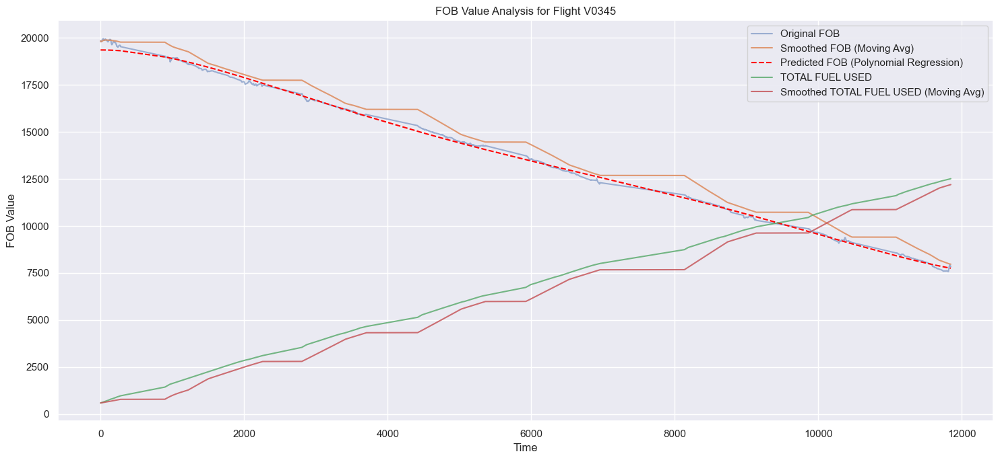

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
specific_flight = 'V0345'
flight_data = adjusted_msn02[adjusted_msn02['Flight'] == specific_flight].copy()
plt.figure(figsize=(15, 7))
plt.plot(flight_data['SECONDS_OF_FLIGHT'], flight_data['VALUE_FOB'], label='Original FOB', alpha=0.5)
plt.plot(flight_data['SECONDS_OF_FLIGHT'], flight_data['VALUE_FOB_MOVING_AVG'], label='Smoothed FOB (Moving Avg)', alpha=0.8)
plt.plot(flight_data['SECONDS_OF_FLIGHT'], flight_data['FOB_POLY'], label='Predicted FOB (Polynomial Regression)', color='red', linestyle='--')
plt.plot(flight_data['SECONDS_OF_FLIGHT'], flight_data['TOTAL_FUEL_USED_PERIOD'], label= 'TOTAL FUEL USED', alpha=0.8)
plt.plot(flight_data['SECONDS_OF_FLIGHT'], flight_data['TOTAL_FUEL_USED_PERIOD_MOVING_AVG'], label='Smoothed TOTAL FUEL USED (Moving Avg)', alpha=0.8)
plt.title(f'FOB Value Analysis for Flight {specific_flight}')
plt.xlabel('Time')
plt.ylabel('FOB Value')
plt.legend()
plt.tight_layout()
plt.show()

## **3.6. Ploting again the FOB along time including variables: 'TOTAL_FUEL_USED_PERIOD', 'EST_FUEL_USED_FROM_FOB' & 'CUMULATIVE_DELTA_FOB'**

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
def plot_FOB_with_new_variables(flight_number, df):
    df_flight = df[df['Flight'] == flight_number]
    df_flight = clean_flight_phases(df_flight)
    df_flight['MINUTE'] = df_flight['UTC_TIME'].dt.strftime('%H:%M')
    sns.set(style="darkgrid")
    fig, ax1 = plt.subplots(figsize=(14, 7))
    sns.lineplot(x='MINUTE', y='VALUE_FOB', data=df_flight, ax=ax1, color='blue', label='VALUE_FOB')
    sns.lineplot(x='MINUTE', y='TOTAL_FUEL_USED_PERIOD', data=df_flight, ax=ax1, color='red', label='TOTAL_FUEL_USED_PERIOD')
    sns.lineplot(x='MINUTE', y='EST_FUEL_USED_FROM_FOB', data=df_flight, ax=ax1, color='green', label='EST_FUEL_USED_FROM_FOB')
    sns.lineplot(x='MINUTE', y='CUMULATIVE_DELTA_FOB', data=df_flight, ax=ax1, color='purple', label='CUMULATIVE_DELTA_FOB')
    ax1.set_title(f'Flight {flight_number} - Fuel Metrics per Minute')
    ax1.set_xlabel('Time of Day (HH:MM)')
    ax1.set_ylabel('Fuel Metrics')
    unique_minutes = df_flight['MINUTE'].unique()
    unique_minutes_sorted = sorted(unique_minutes)
    x_labels = unique_minutes_sorted[::n]
    ax1.set_xticks(ticks=x_labels)
    ax1.set_xticklabels(x_labels, rotation=45)
    ax1.legend()
    fig.tight_layout()
    plt.show()

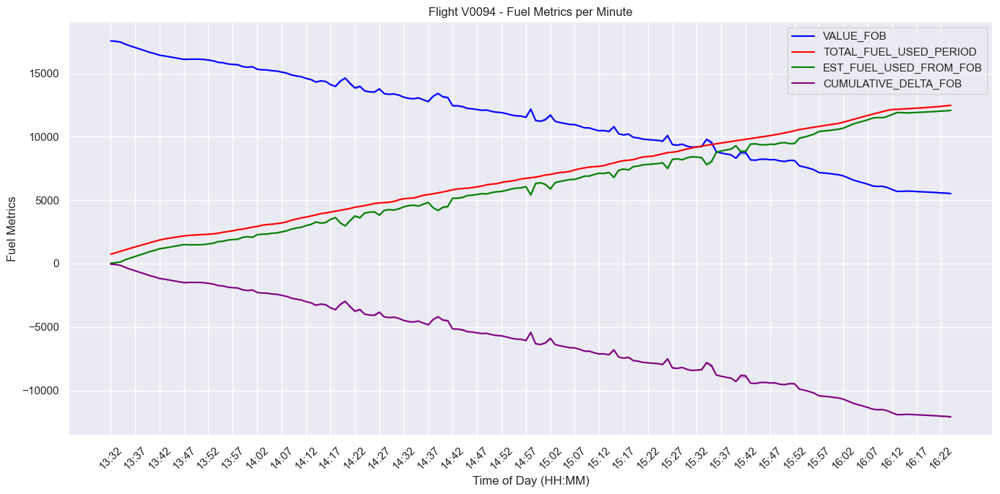

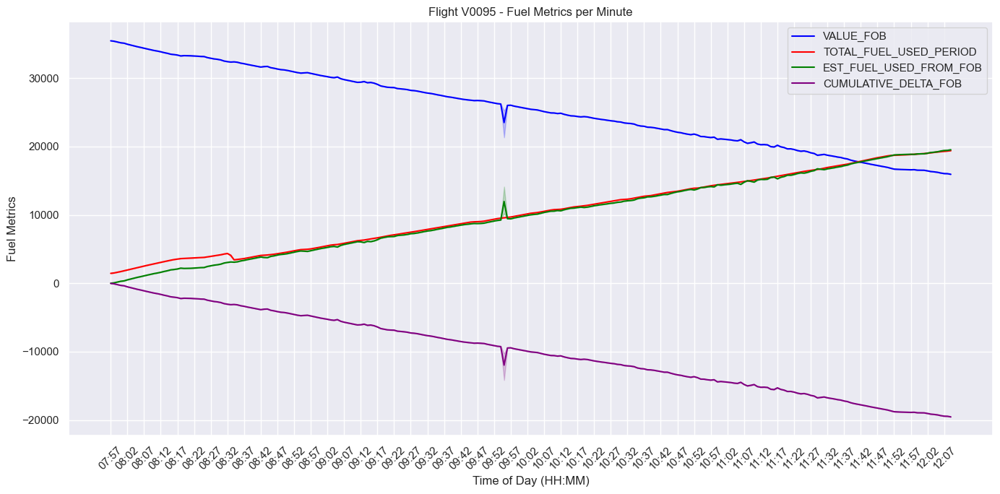

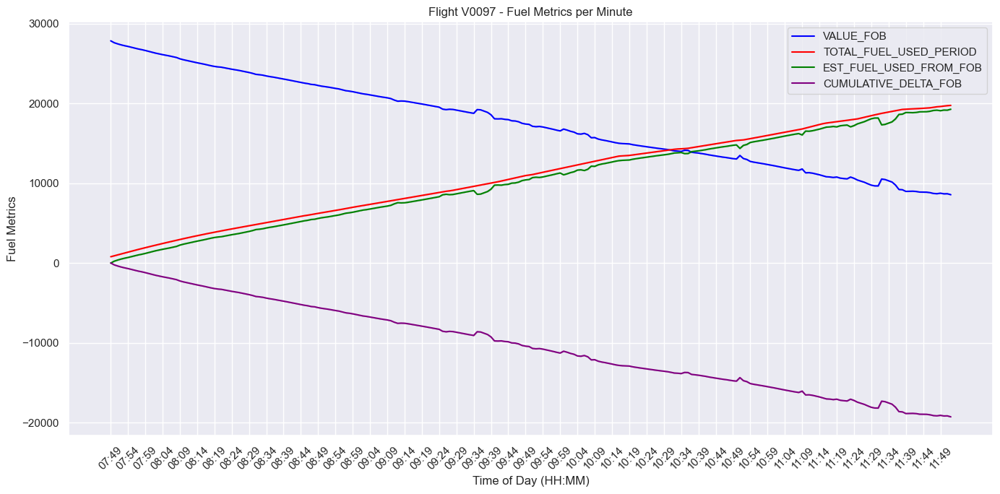

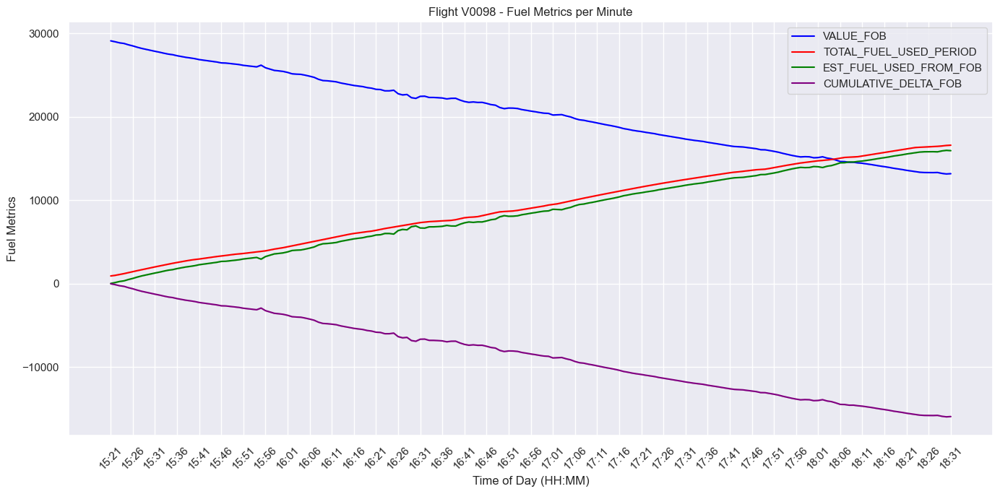

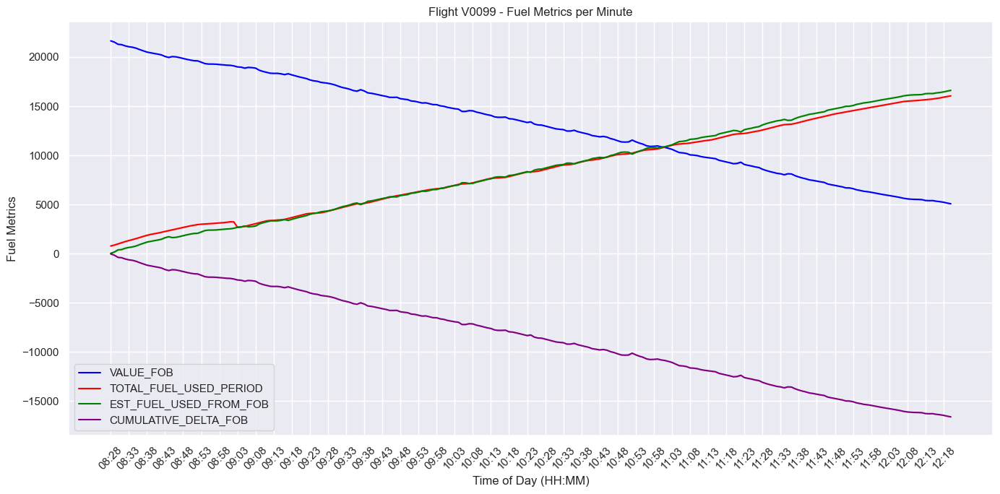

...

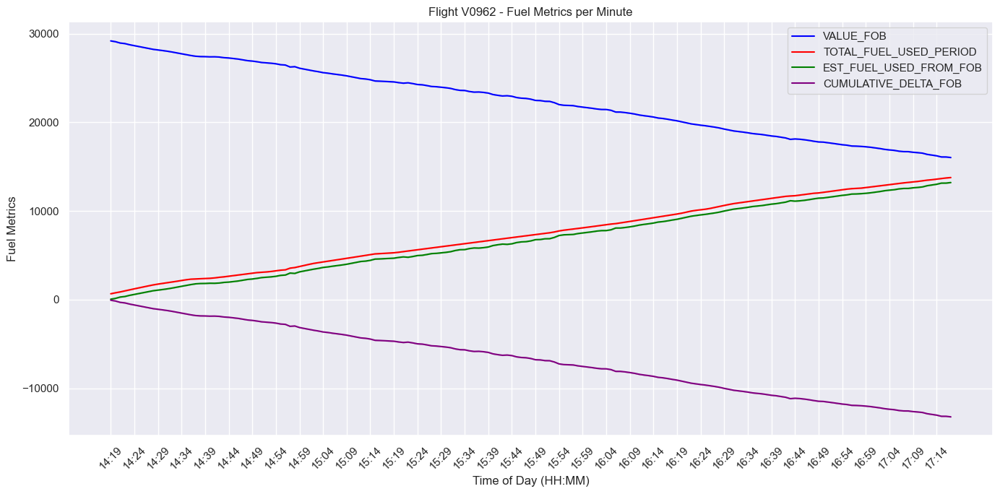

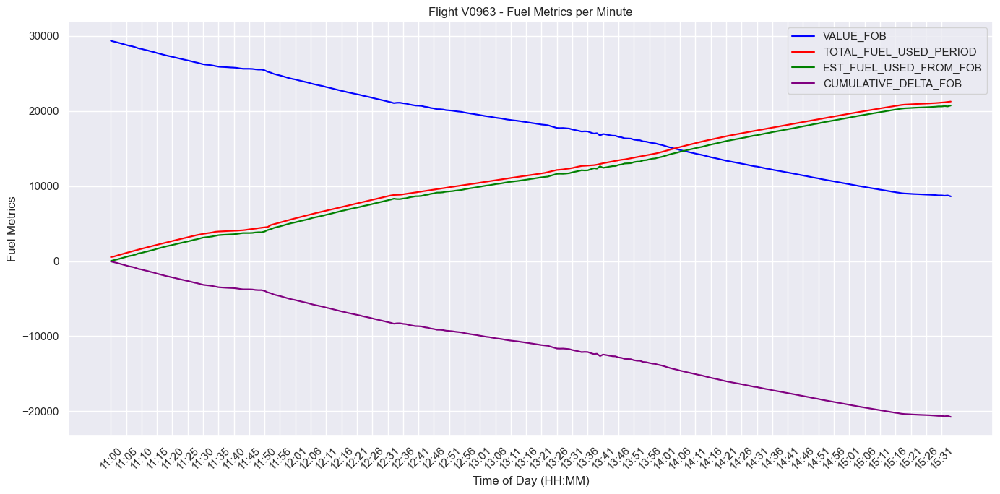

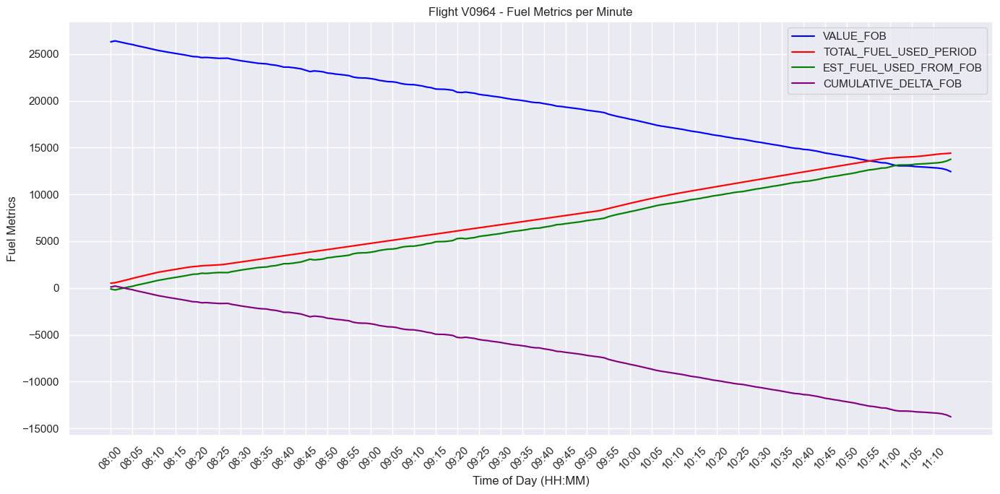

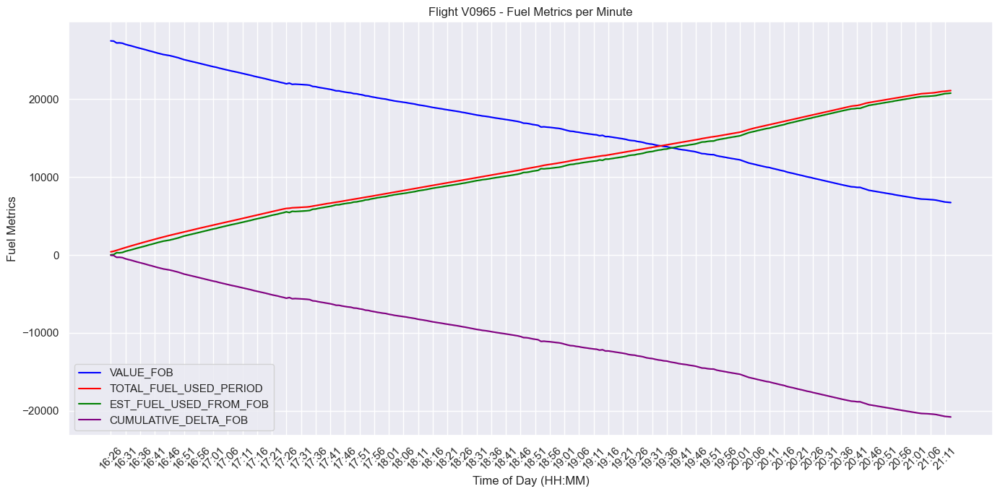

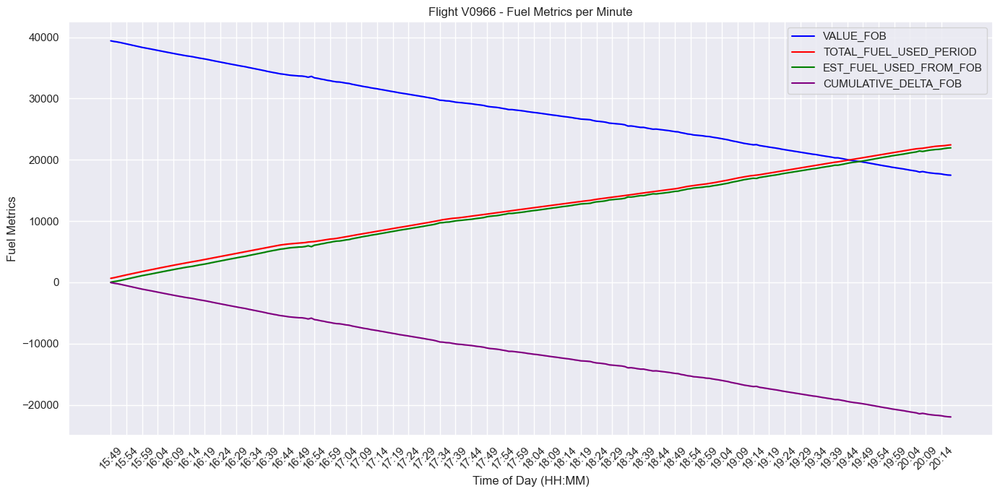

In [ ]:
for flight in flights_list.keys():
    plot_FOB_with_new_variables(flight, adjusted_msn02)

# **4. PCA Classification Analysis**

C:\Users\fhuer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\676517020.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Cluster'] = labels


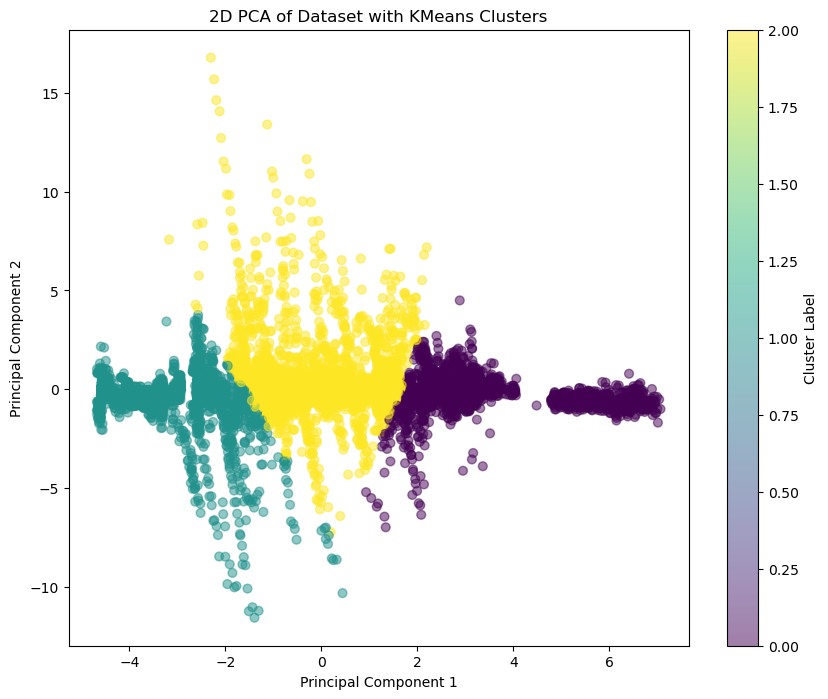

In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
df_filtered = adjusted_msn02.dropna()
X = df_filtered.drop(['UTC_TIME', 'Flight'], axis=1)
scaler = StandardScaler()
pca = PCA(n_components=2)
kmeans = KMeans(n_clusters=3, random_state=42)
pipeline = make_pipeline(scaler, pca, kmeans)
pipeline.fit(X)
labels = pipeline.predict(X)
pca_components = pca.fit_transform(scaler.fit_transform(X))
df_filtered['Cluster'] = labels
plt.figure(figsize=(10, 8))
plt.scatter(pca_components[:, 0], pca_components[:, 1], c=labels, cmap='viridis', s=40, alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('2D PCA of Dataset with KMeans Clusters')
plt.colorbar(label='Cluster Label')
plt.show()

C:\Users\fhuer\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


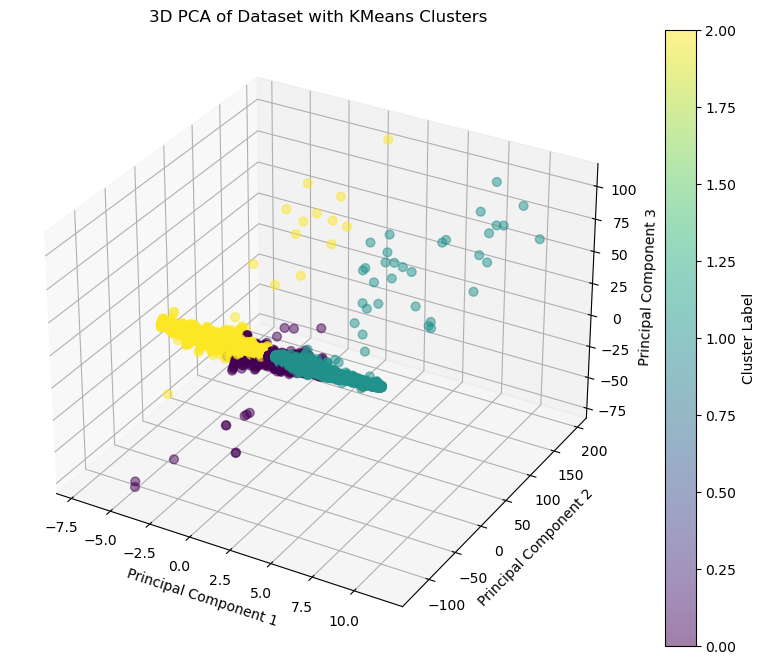

In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import pandas as pd
import matplotlib.pyplot as plt
def PCA_Analysis(adjusted_msn02):
    df_filtered = adjusted_msn02.dropna()
    X = df_filtered.drop(['UTC_TIME', 'Flight'], axis=1)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    pca = PCA(n_components=3)
    pca_components = pca.fit_transform(X_scaled)
    kmeans = KMeans(n_clusters=3, random_state=42)
    labels = kmeans.fit_predict(pca_components)
    df_filtered['Cluster'] = labels
    return df_filtered, pca_components, labels
df_filtered, pca_components, labels = PCA_Analysis(adjusted_msn02)
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(pca_components[:, 0], pca_components[:, 1], pca_components[:, 2],
                     c=labels, cmap='viridis', s=40, alpha=0.5)
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.title('3D PCA of Dataset with KMeans Clusters')
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Cluster Label')
plt.show()

In [ ]:
df_filtered.groupby('Cluster').mean()

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\4030214537.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_filtered.groupby('Cluster').mean()


,FLIGHT_PHASE_COUNT,TOTAL_FUEL_USED_PERIOD,DELTA_TOTAL_FUEL_USED,CUMULATIVE_DELTA_TOTAL_FUEL_USED,PERCENTAGE_CHANGE_TOTAL_FUEL_USED,VALUE_FOB,DELTA_FOB,CUMULATIVE_DELTA_FOB,PERCENTAGE_CHANGE_FOB,EST_FOB,FOB_ERROR,FW_GEO_ALTITUDE,SECONDS_OF_FLIGHT,FLIGHT_DURATION_SECONDS,IS_OUTLIER_FOB,IS_OUTLIER_TOTAL_FUEL_USED,FOB_POLY,VALUE_FOB_MOVING_AVG,TOTAL_FUEL_USED_PERIOD_MOVING_AVG
Cluster,,,,,,,,,,,,,,,,,,,
0,8.0,6340.449563,1.109283,5812.505475,0.024574,14523.667335,-1.169334,-5745.861658,-0.008567,14457.023519,66.643817,18408.494061,4399.313870,9337.734589,0.059855,0.030051,14518.488756,14894.254463,5969.852721
1,8.0,4809.020231,1.512334,4131.536436,0.057674,26078.449950,-1.422889,-4132.235563,-0.005638,26079.149078,-0.699127,14605.064297,2942.855582,12126.593570,0.020444,0.143982,26082.112760,26462.119709,4426.006822
2,8.0,14644.941419,1.215801,13985.057716,0.008954,13975.112445,-1.270802,-13973.545524,-0.010147,13963.600254,11.512191,13374.229844,10817.551614,14403.527169,0.072171,0.000150,13976.504830,14341.373044,14284.047438


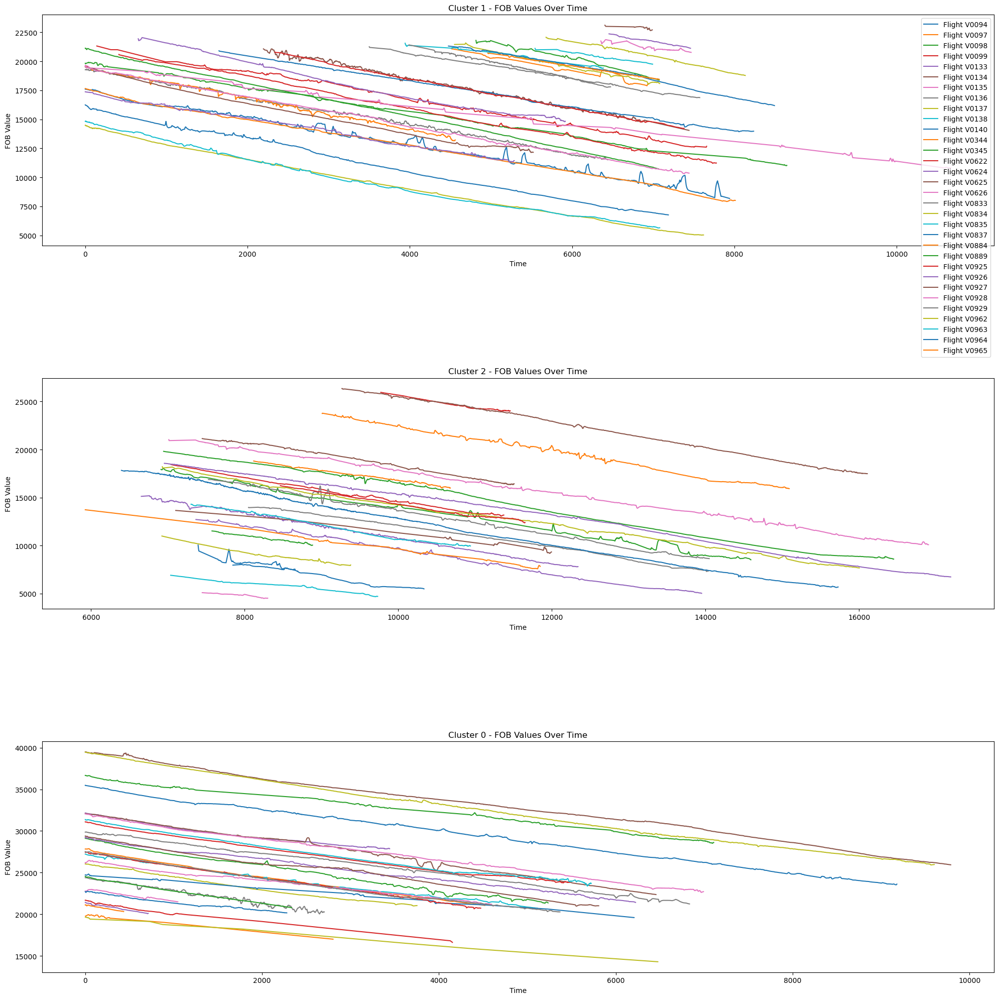

In [ ]:
import matplotlib.pyplot as plt
clusters = df_filtered['Cluster'].unique()
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(20, 20))
for i, cluster in enumerate(clusters):
    cluster_data = df_filtered[df_filtered['Cluster'] == cluster]
    for flight in cluster_data['Flight'].unique():
        flight_data = cluster_data[cluster_data['Flight'] == flight]
        axes[i].plot(flight_data['SECONDS_OF_FLIGHT'], flight_data['VALUE_FOB'], label=f'Flight {flight}')
    axes[i].set_title(f'Cluster {cluster} - FOB Values Over Time')
    axes[i].set_xlabel('Time')
    axes[i].set_ylabel('FOB Value')
axes[0].legend(loc='upper right')
plt.tight_layout()
plt.show()

## **4.1. Adding Leaks to the final dataset msn02**

In [ ]:
def simulate_uniform_leak(df, leak_rate):
    df_with_leak = df.copy()
    for flight in df_with_leak['Flight'].unique():
        flight_indices = df_with_leak[df_with_leak['Flight'] == flight].index
        df_with_leak.loc[flight_indices, 'VALUE_FOB'] -= leak_rate * np.arange(len(flight_indices))
    return df_with_leak

### **4.1.1. Genrating the leak for each msn02 file before preprocessing**

In [ ]:
df_leak_05 = simulate_uniform_leak(msn02, leak_rate=0.5)
df_leak_1 = simulate_uniform_leak(msn02, leak_rate=1)
df_leak_2 = simulate_uniform_leak(msn02, leak_rate=2)

In [ ]:
df_leak_05.head()

,UTC_TIME,MSN,Flight,ENGINE_RUNNING_1,ENGINE_RUNNING_2,ENGINE_RUNNING_3,ENGINE_RUNNING_4,FLIGHT_PHASE_COUNT,FUEL_FLOW_1,FUEL_FLOW_2,...,STATE_FUEL_QTY_ACCURACY_LST_DEGRADED,STATE_FUEL_QTY_ACCURACY_RST_DEGRADED,STATUS_FUEL_QTY_PART_UNUSABLE_LST,STATUS_FUEL_QTY_PART_UNUSABLE_RST,STATUS_FUEL_QTY_UNUSABLE_LST,STATUS_FUEL_QTY_UNUSABLE_RST,STATUS_OVERFLOW_LST,STATUS_OVERFLOW_RST,VALUE_FUEL_VOL_LST,VALUE_FUEL_VOL_RST
0,2011-03-09 12:06:01,A400M-0002,V0136,True,True,True,True,NaN,NaN,NaN,...,True,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2011-03-09 12:06:02,A400M-0002,V0136,False,False,False,False,1.0,0.0,0.0,...,False,False,0.0,0.0,0.0,0.0,0.0,0.0,41.25817,0.0
2,2011-03-09 12:06:03,A400M-0002,V0136,False,False,False,False,1.0,0.0,0.0,...,False,False,0.0,0.0,0.0,0.0,0.0,0.0,41.27073,0.0
3,2011-03-09 12:06:04,A400M-0002,V0136,False,False,False,False,1.0,0.0,0.0,...,False,False,0.0,0.0,0.0,0.0,0.0,0.0,41.27275,0.0
4,2011-03-09 12:06:05,A400M-0002,V0136,False,False,False,False,1.0,0.0,0.0,...,False,False,0.0,0.0,0.0,0.0,0.0,0.0,41.27908,0.0


### **4.1.2. Preprocessing each file with the leak**

In [ ]:
def process_data_pipeline(chosen_df, flight_phase = 8, duration = 50):

    final_features = ['UTC_TIME', 'FLIGHT_PHASE_COUNT', 'Flight','TOTAL_FUEL_USED_PERIOD', 'DELTA_TOTAL_FUEL_USED', 'CUMULATIVE_DELTA_TOTAL_FUEL_USED',
                      'PERCENTAGE_CHANGE_TOTAL_FUEL_USED', 'VALUE_FOB', 'DELTA_FOB', 'CUMULATIVE_DELTA_FOB', 'PERCENTAGE_CHANGE_FOB', 'EST_FOB',
                      'FOB_ERROR', 'FW_GEO_ALTITUDE', 'SECONDS_OF_FLIGHT', 'FLIGHT_DURATION_SECONDS'
                     ]
    df_interpolated = interpolate_fob(chosen_df)
    filtered_df, flight_list = filter_flights_by_phase_and_duration(df_interpolated, flight_phase, duration)
    filtered_df = clean_flight_phases(filtered_df)
    df_with_new_columns = add_new_columns(filtered_df)
    all_features_df = df_with_new_columns
    final_df = all_features_df[final_features] if 'final_features' in locals() else all_features_df
    df_flagged_outliers = flag_outliers(final_df)
    df_poly_regression = poly_regression_per_flight(df_flagged_outliers)
    df_final_processed = PCA_Analysis(df_poly_regression)
    return df_final_processed

In [ ]:
final_msn02_noleak = process_data_pipeline(msn02)
final_msn02_leak_05, _, _ = process_data_pipeline(df_leak_05)
final_msn02_leak_05['LEAK'] = 0.5
final_msn02_leak_1, _, _ = process_data_pipeline(df_leak_1)
final_msn02_leak_1['LEAK'] = 1
final_msn02_leak_2, _, _ = process_data_pipeline(df_leak_2)
final_msn02_leak_2['LEAK'] = 2

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\956233596.py:20: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df_cleaned = df.groupby('Flight').apply(enforce_phase_progression).reset_index(drop=True)
C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\2342746356.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['IS_OUTLIER_FOB'] = ((dataset['PERCENTAGE_CHANGE_FOB'] > upper_bound_pct_change_f

In [ ]:
filtered_msn37 = msn37[ (msn37[['FUEL_USED_1', 'FUEL_USED_2', 'FUEL_USED_3', 'FUEL_USED_4', 'VALUE_FOB']].notnull().all(axis=1))]
final_msn37 = process_data_pipeline(filtered_msn37)

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\552126964.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['UTC_TIME'] = pd.to_datetime(df['UTC_TIME'], errors='ignore')
C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\2342746356.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['IS_OUTLIER_FOB'] = ((dataset['PERCENTAGE_CHANGE_FOB'] > upper_bound_pct_change_fob) | \
C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\2342746356.py:25: SettingWithCopyWarning: 
A value is trying to be set on a 

In [ ]:
final_msn37.to_csv('final_msn37.csv', index = False)

In [ ]:
msn37_leak_05 = simulate_uniform_leak(filtered_msn37, leak_rate=0.5)
final_msn37_leak_05 = process_data_pipeline(msn37_leak_05)

C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\2342746356.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['IS_OUTLIER_FOB'] = ((dataset['PERCENTAGE_CHANGE_FOB'] > upper_bound_pct_change_fob) | \
C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\2342746356.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['IS_OUTLIER_TOTAL_FUEL_USED'] = ((dataset['PERCENTAGE_CHANGE_TOTAL_FUEL_USED'] > upper_bound_pct_change_total_fuel) | \
C:\Users\fhuer\AppData\Local\Temp\ipykernel_6860\2464898123.p

In [ ]:
final_msn37_leak_05.to_csv('final_msn37_leak_05.csv', index = False)

### **4.1.3. Ploting the VALUE_FOB for each file**

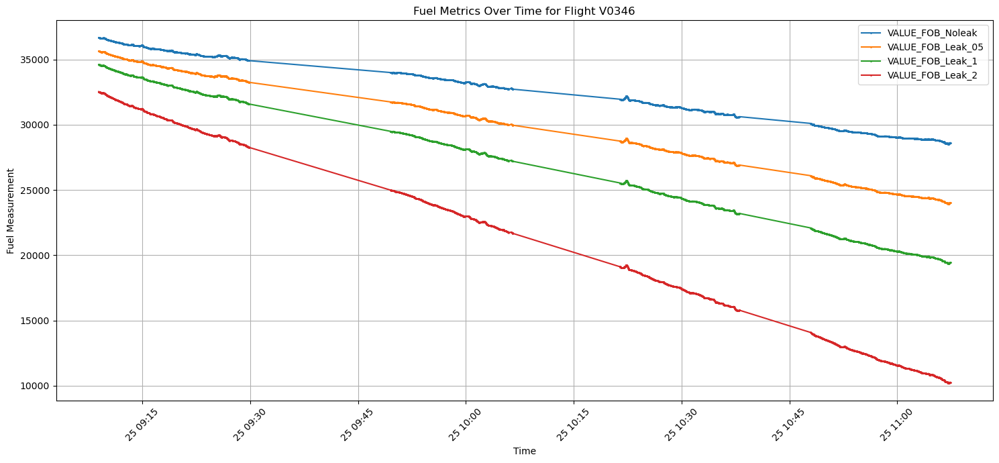

In [ ]:
import matplotlib.pyplot as plt
specific_flight = 'V0346'
flight_df_noleak = final_msn02_noleak[adjusted_msn02['Flight'] == specific_flight]
flight_df_leak_05 = final_msn02_leak_05[adjusted_msn02['Flight'] == specific_flight]
flight_df_leak_1 = final_msn02_leak_1[adjusted_msn02['Flight'] == specific_flight]
flight_df_leak_2 = final_msn02_leak_2[adjusted_msn02['Flight'] == specific_flight]
plt.figure(figsize=(15, 7))
plt.plot(flight_df_noleak['UTC_TIME'], flight_df_noleak['VALUE_FOB'], label='VALUE_FOB_Noleak', marker='o', markersize=1, linestyle='-')
plt.plot(flight_df_leak_05['UTC_TIME'], flight_df_leak_05['VALUE_FOB'], label='VALUE_FOB_Leak_05', marker='o', markersize=1, linestyle='-')
plt.plot(flight_df_leak_1['UTC_TIME'], flight_df_leak_1['VALUE_FOB'], label='VALUE_FOB_Leak_1', marker='o', markersize=1, linestyle='-')
plt.plot(flight_df_leak_2['UTC_TIME'], flight_df_leak_2['VALUE_FOB'], label='VALUE_FOB_Leak_2', marker='o', markersize=1, linestyle='-')
plt.title(f'Fuel Metrics Over Time for Flight {specific_flight}')
plt.xlabel('Time')
plt.ylabel('Fuel Measurement')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## **4.2. Saving All the files as csv with and without leaks**

In [ ]:
final_msn02_noleak.to_csv('final_msn02_noleak.csv', index=False)
final_msn02_leak_05.to_csv('final_msn02_leak_05.csv', index=False)
final_msn02_leak_1.to_csv('final_msn02_leak_1.csv', index=False)
final_msn02_leak_2.to_csv('final_msn02_leak_2.csv', index=False)